In [1]:
!pip install h2o

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.2/265.2 MB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.44.0.3-py2.py3-none-any.whl size=265293968 sha256=d460947e56fc52a602a119df202d5b640c5dc7e06e91ae15408ca055178ada9c
  Stored in directory: /root/.cache/pip/wheels/77/9a/1c/2da26f943fd46b57f3c20b54847b936b9152b831dc7447cf71
Successfully built h2o


In [2]:
import h2o
from h2o.automl import H2OAutoML

In [3]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpt5itl_om
  JVM stdout: /tmp/tmpt5itl_om/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpt5itl_om/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 27 days
H2O_cluster_name:,H2O_from_python_unknownUser_wuxgfb
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


### importing data

In [4]:
day = h2o.import_file("day.csv")

hour = h2o.import_file("hour.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [5]:
#target column

y = "cnt"

### Split into train & test

In [6]:
# splitting day dataset
splits_day = day.split_frame(ratios = [0.8], seed = 1)
train_day = splits_day[0]
test_day = splits_day[1]

#splitting hour dataset
splits_hour = day.split_frame(ratios = [0.8], seed = 1)
train_hour = splits_hour[0]
test_hour = splits_hour[1]

### testing models on Day dataset

#### model 1

In [7]:
# Run AutoML for 10 minutes
aml = H2OAutoML(max_runtime_secs=600, seed=1)
aml.train(y=y, training_frame=train_day)

AutoML progress: |
14:44:03.745: _train param, Dropping bad and constant columns: [dteday]

██
14:44:10.148: _train param, Dropping bad and constant columns: [dteday]


14:44:11.932: _train param, Dropping bad and constant columns: [dteday]

█
14:44:16.687: _train param, Dropping unused columns: [dteday]
14:44:17.0: _train param, Dropping bad and constant columns: [dteday]

██
14:44:21.82: _train param, Dropping bad and constant columns: [dteday]

█
14:44:26.856: _train param, Dropping bad and constant columns: [dteday]

█
14:44:30.329: _train param, Dropping bad and constant columns: [dteday]

█
14:44:33.575: _train param, Dropping bad and constant columns: [dteday]

█
14:44:37.405: _train param, Dropping unused columns: [dteday]


14:44:37.702: _train param, Dropping unused columns: [dteday]
14:44:38.32: _train param, Dropping bad and constant columns: [dteday]

██
14:44:42.430: _train param, Dropping bad and constant columns: [dteday]

██
14:44:47.736: _train param, Dropping bad and

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),1/1
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_1_20240217_144403_model_59,93.1523,8677.35,66.9168,0.0309652,8677.35,391,0.037761,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_12,102.693,10545.8,69.0987,0.0259967,10545.8,529,0.032917,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_51,103.076,10624.7,63.5736,0.0364295,10624.7,401,0.032205,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_43,103.456,10703,74.2977,0.0345611,10703,399,0.032722,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_50,108.278,11724.1,70.7343,0.0353118,11724.1,381,0.030051,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_5,110.504,12211.1,75.2453,0.0338933,12211.1,484,0.03774,GBM
StackedEnsemble_AllModels_2_AutoML_1_20240217_144403,116.541,13581.7,81.6209,0.0370405,13581.7,284,0.078936,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20240217_144403,116.817,13646.2,76.5354,0.0298819,13646.2,281,0.103605,StackedEnsemble
GBM_grid_1_AutoML_1_20240217_144403_model_44,117.215,13739.4,74.4341,0.0385557,13739.4,381,0.039066,GBM
GBM_grid_1_AutoML_1_20240217_144403_model_29,117.541,13815.9,84.0961,0.0479065,13815.9,340,0.03373,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

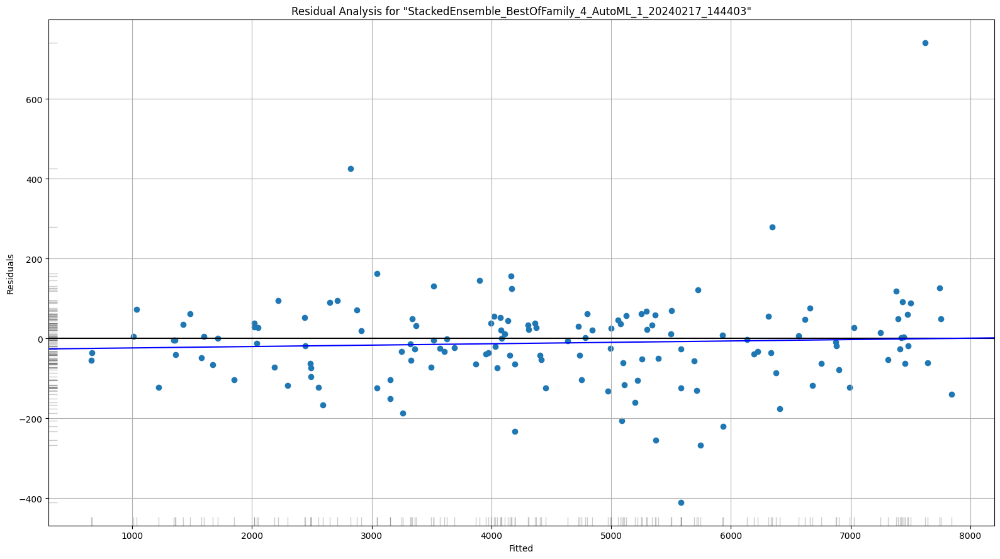

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

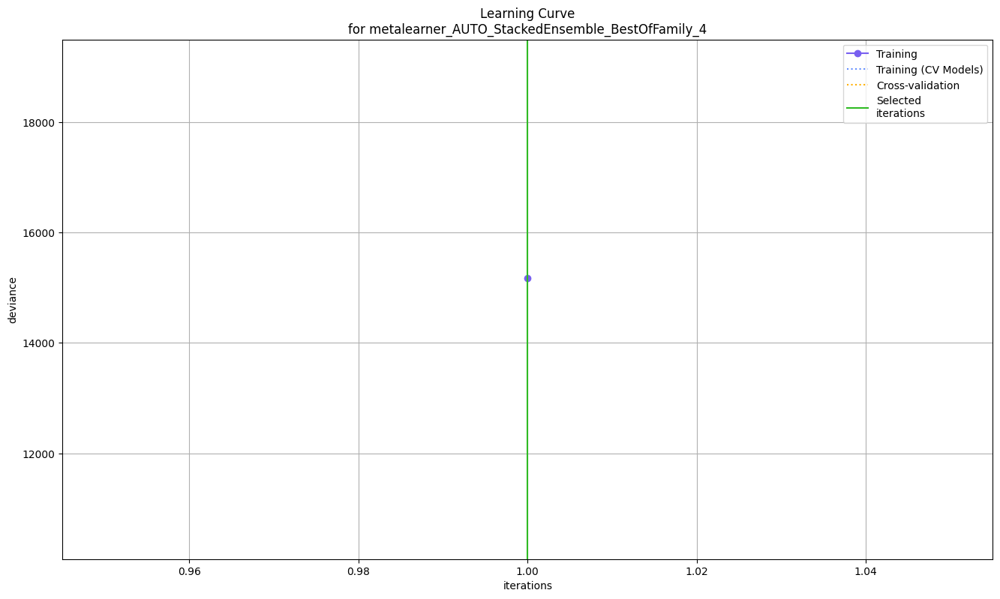

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

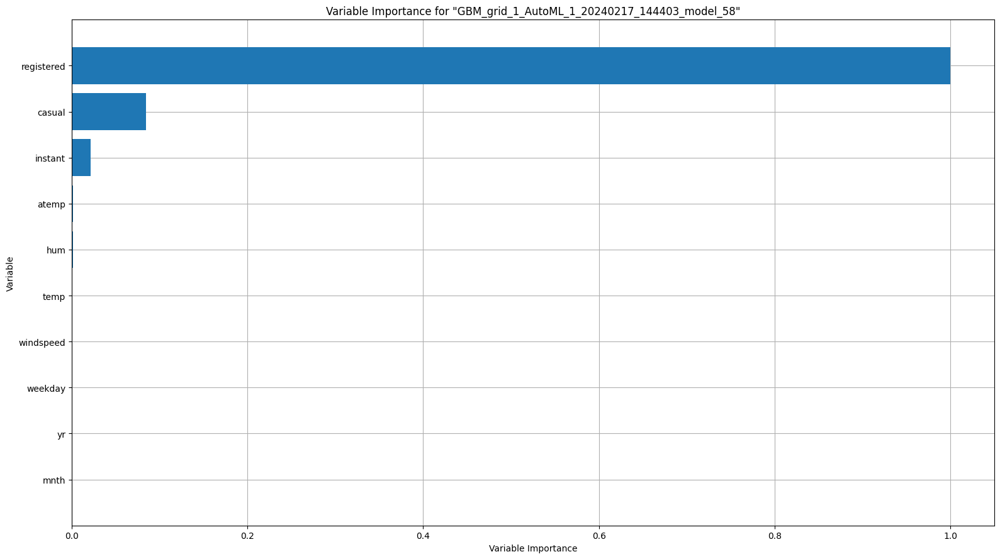

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

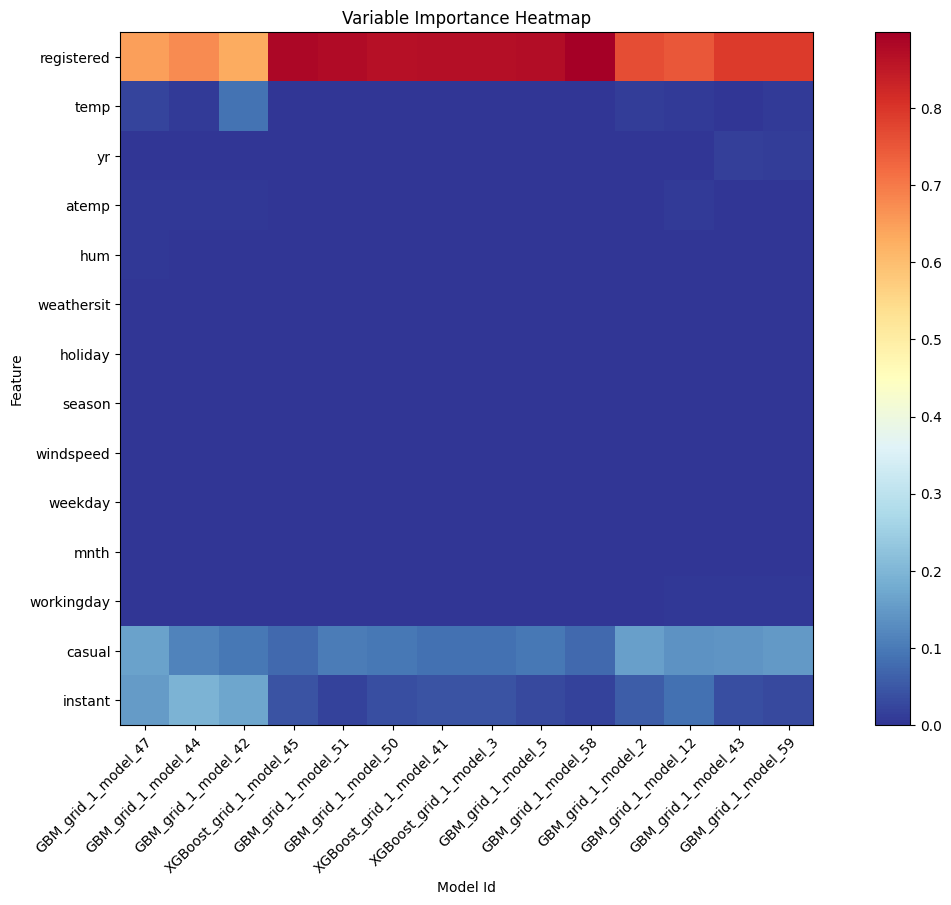

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

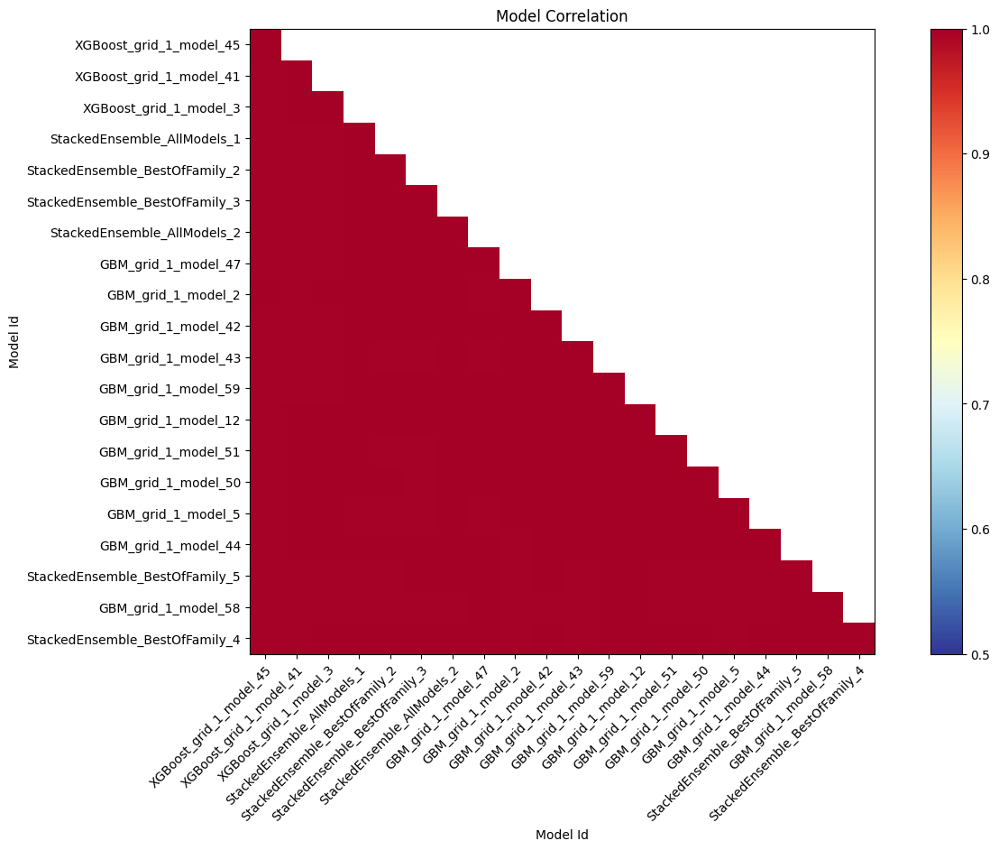

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

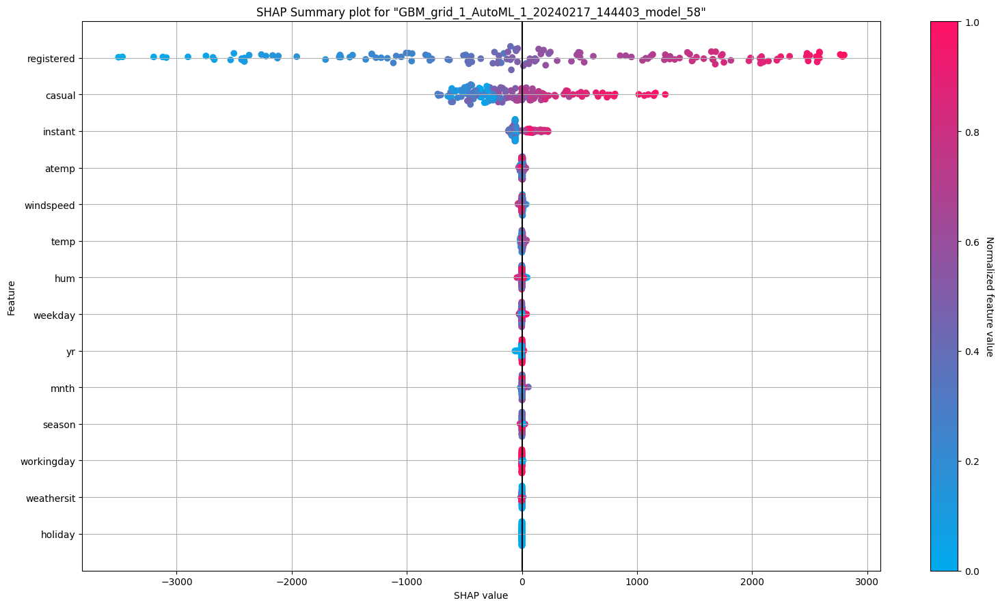

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

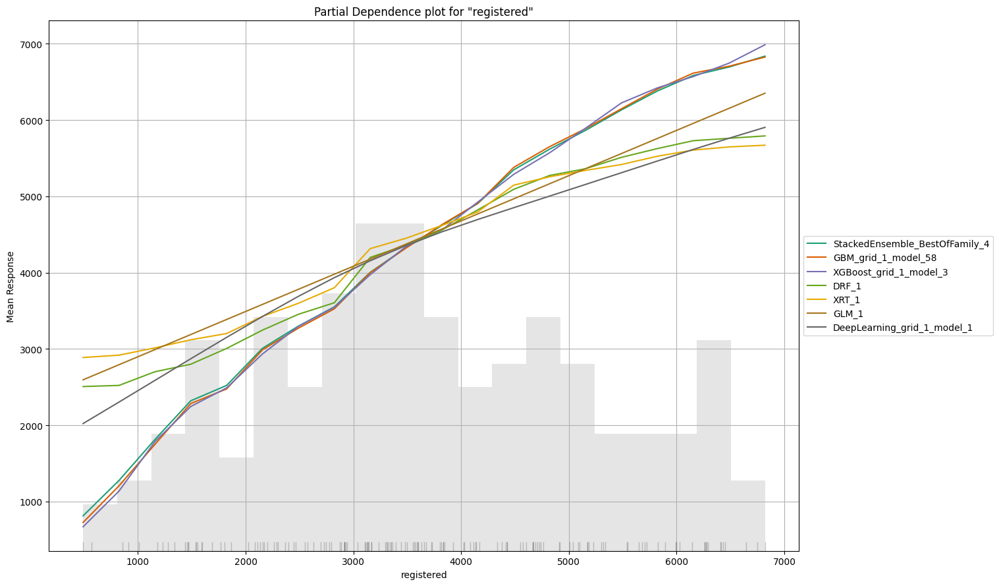

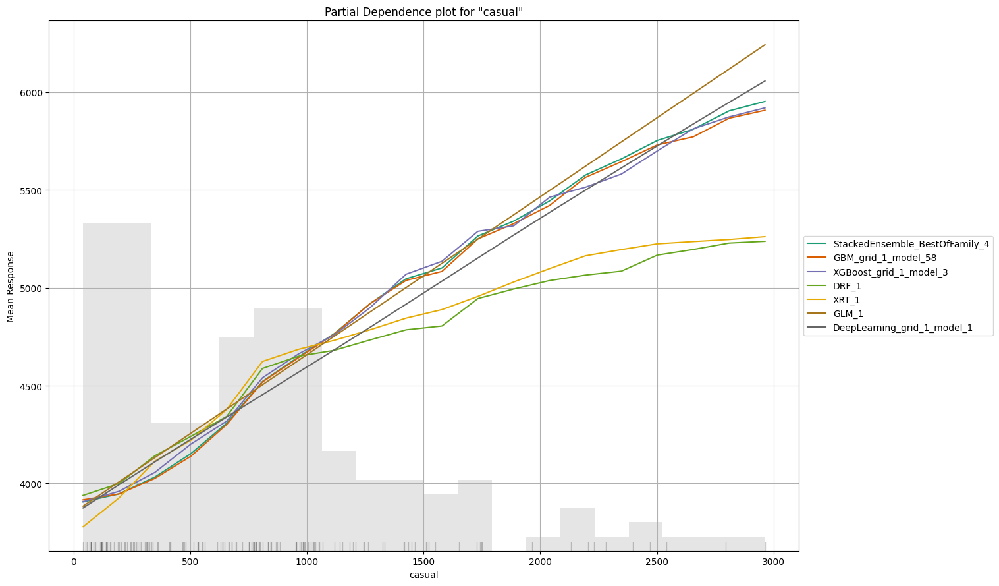

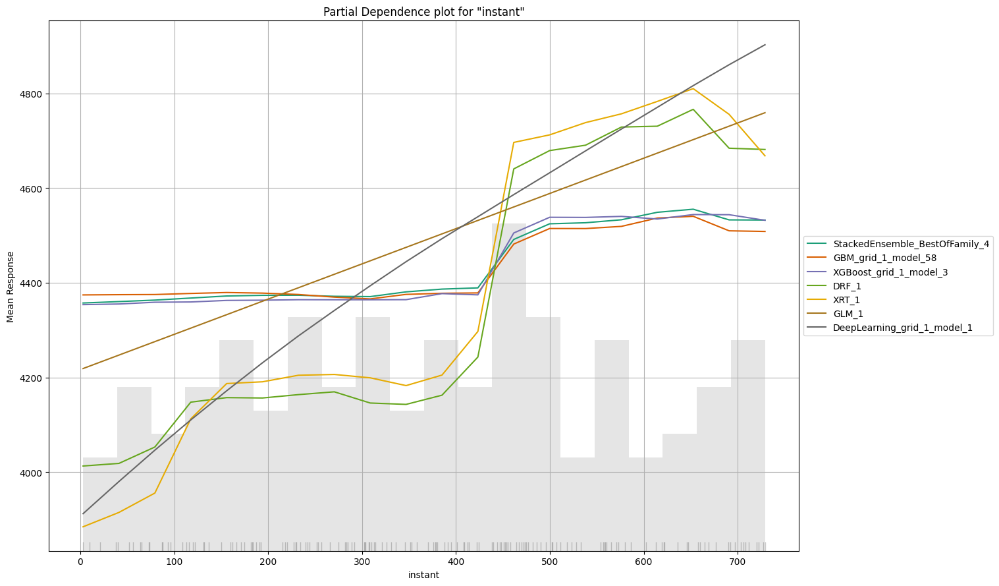

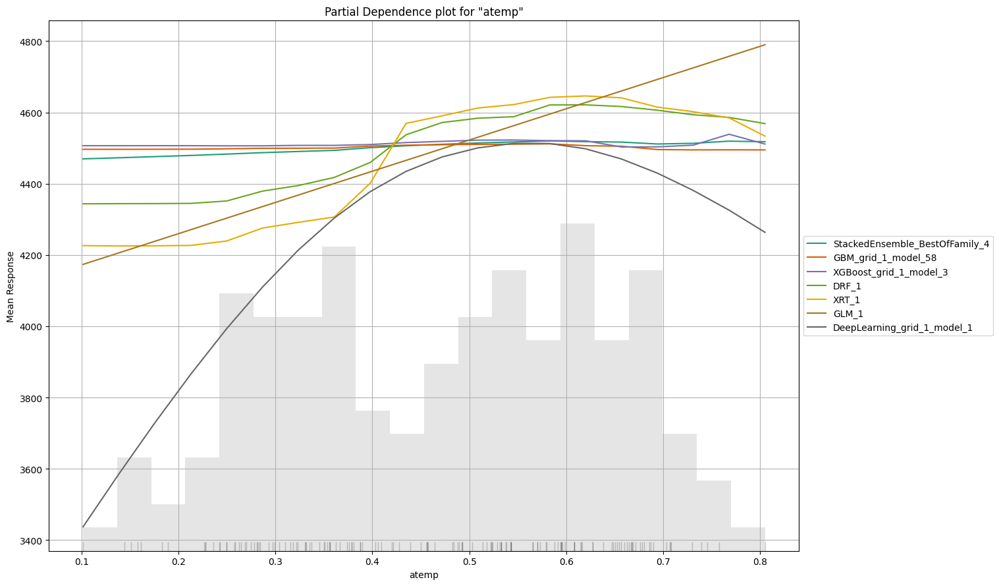

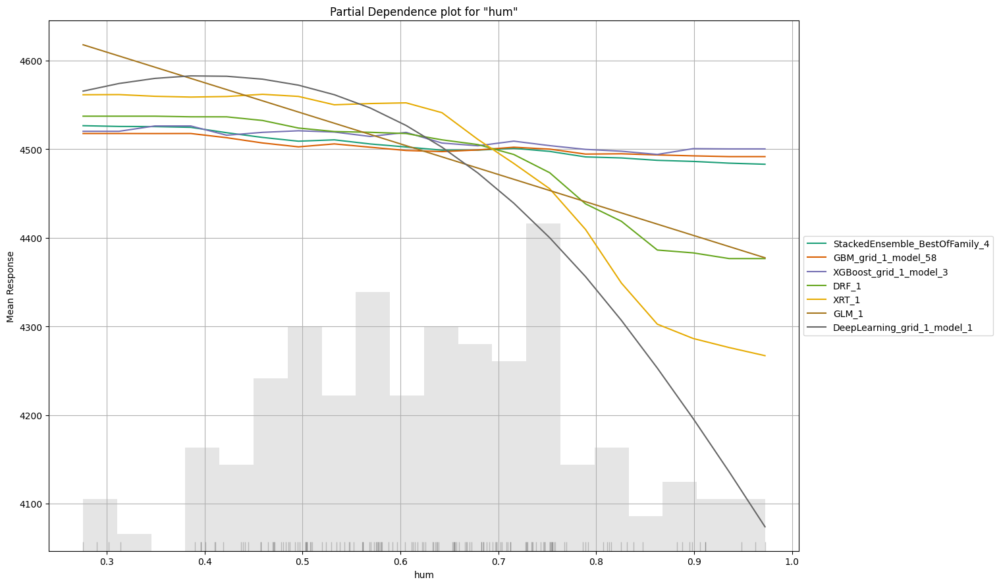

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

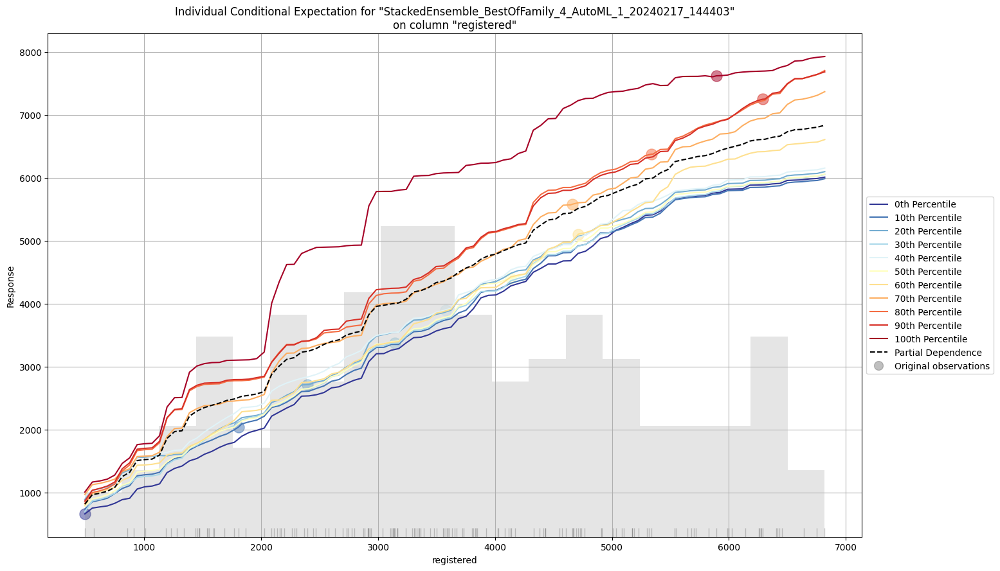

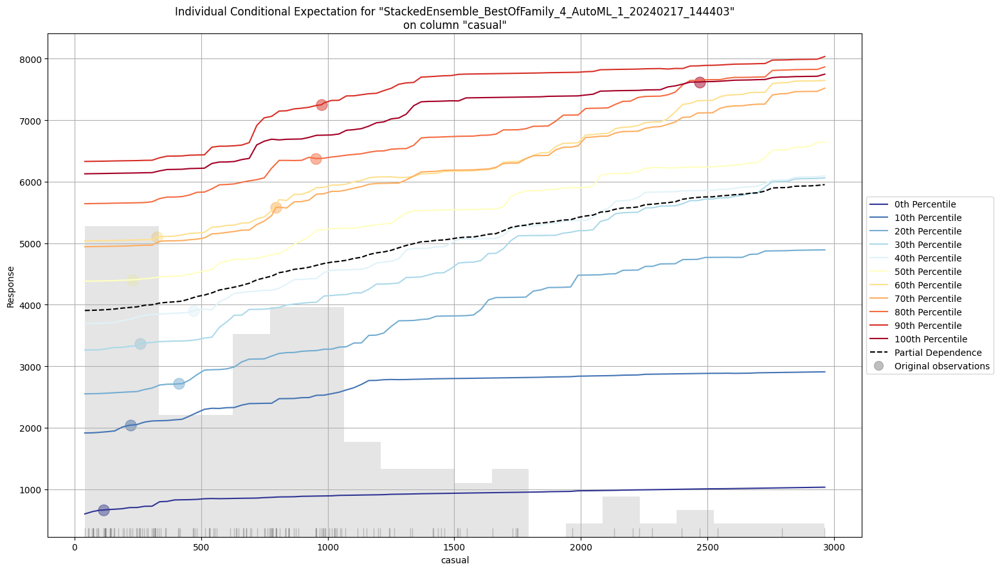

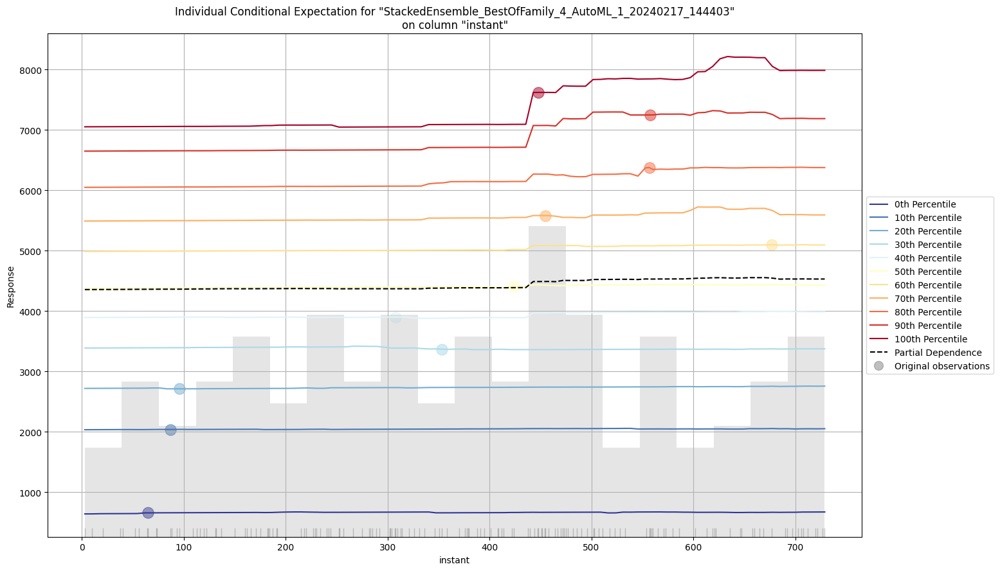

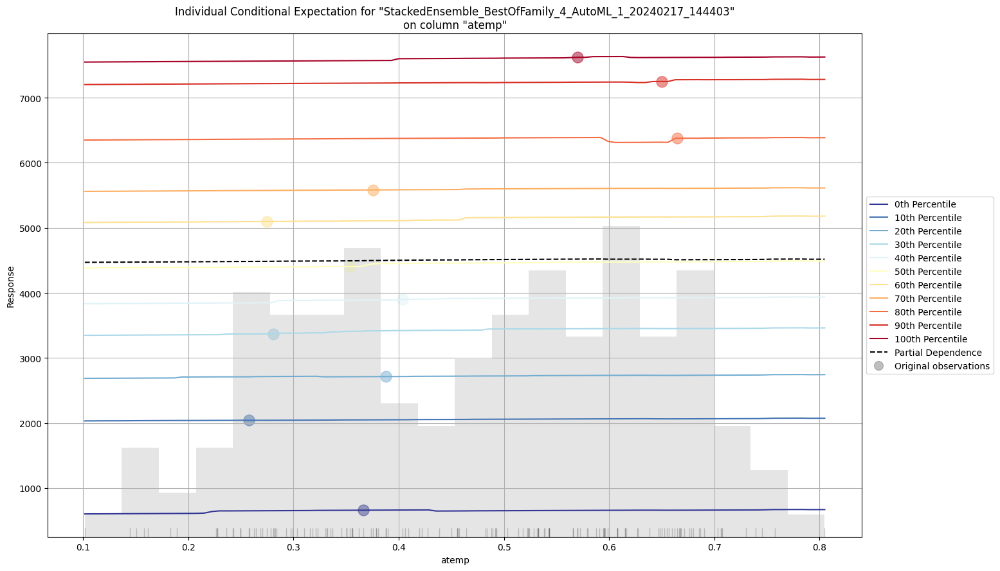

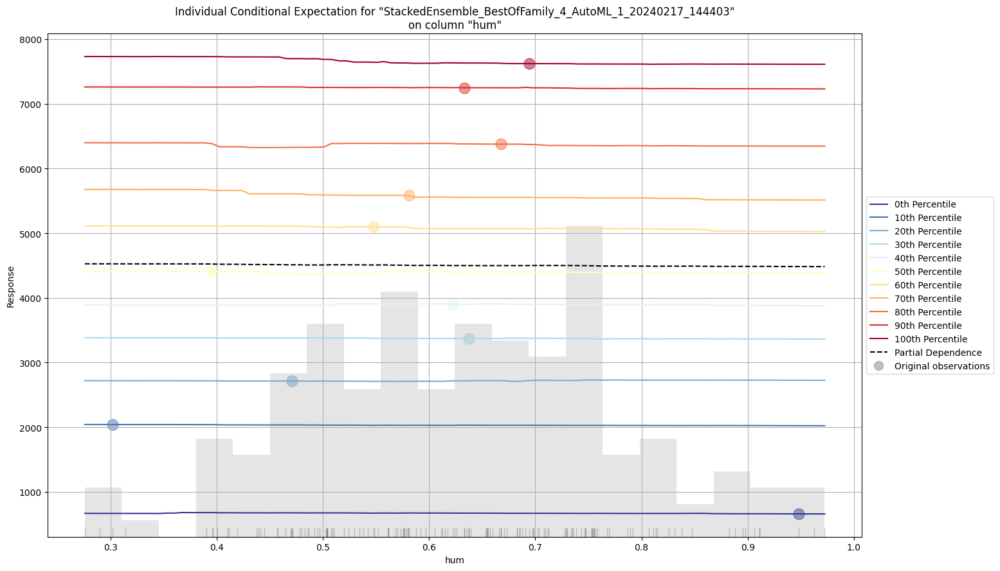

In [8]:
# Explain leader model & compare with all AutoML models
exa = aml.explain(test_day)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

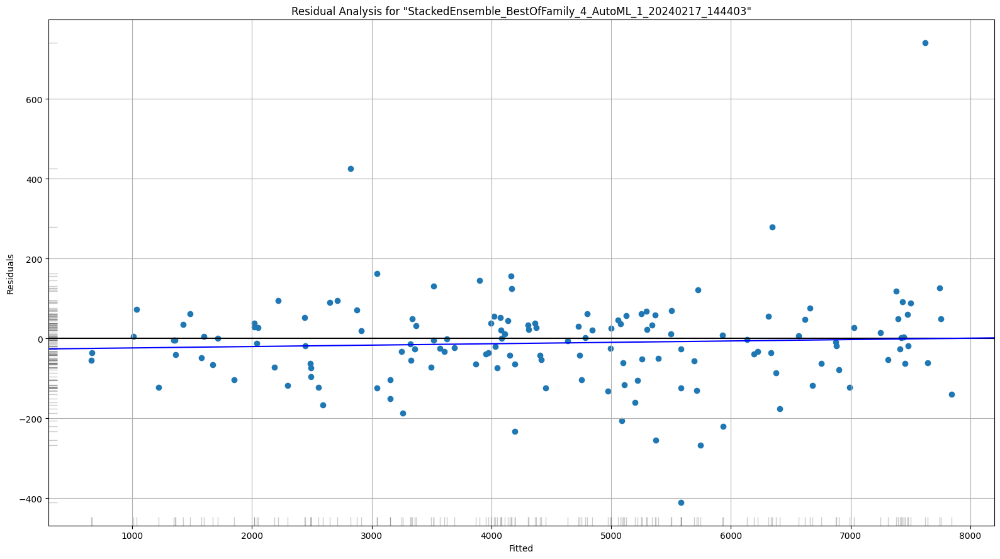

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

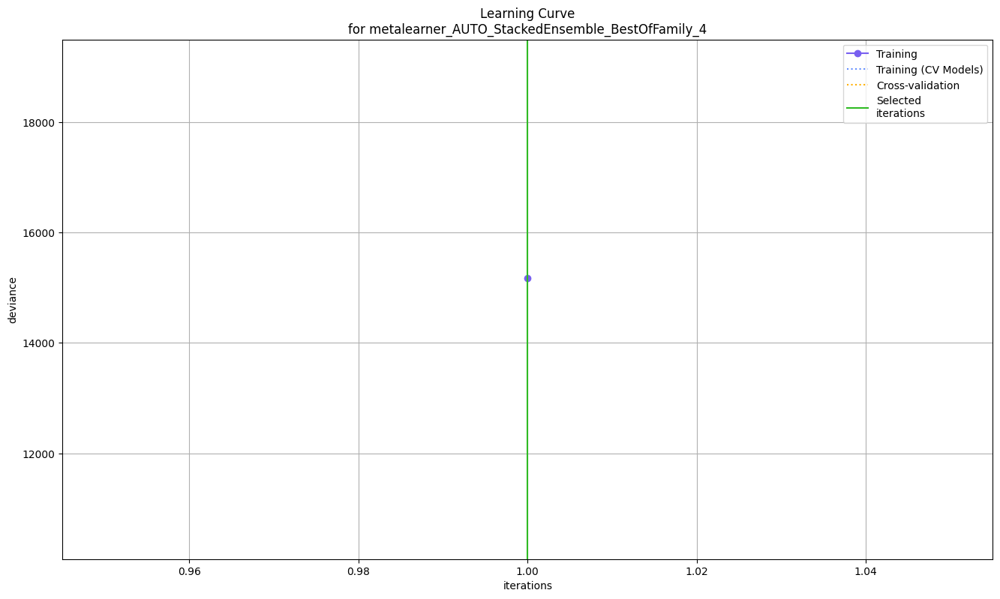

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

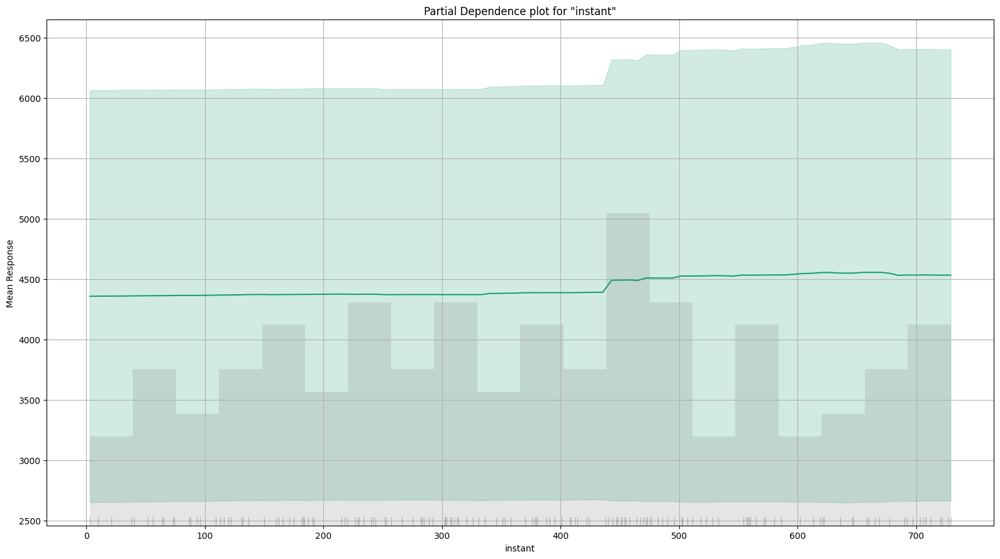

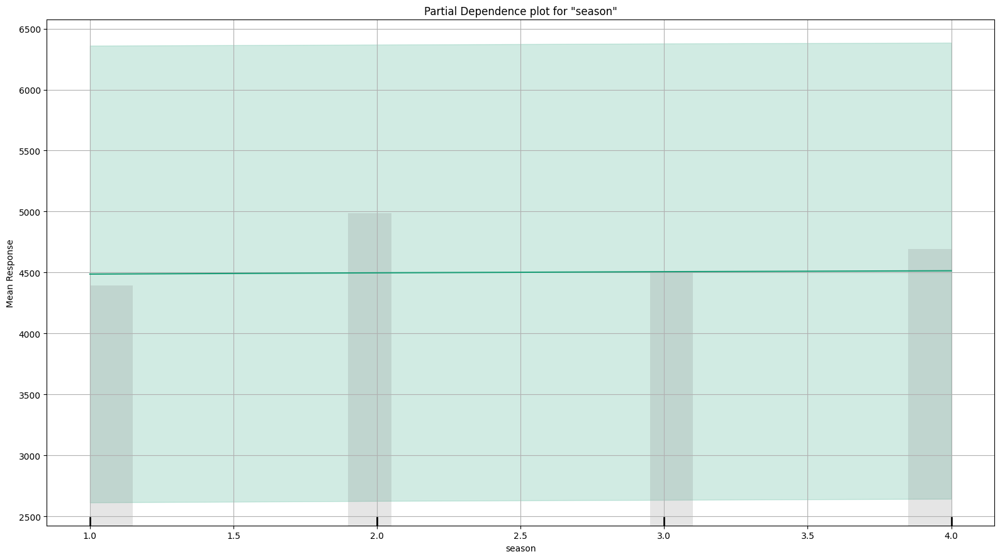

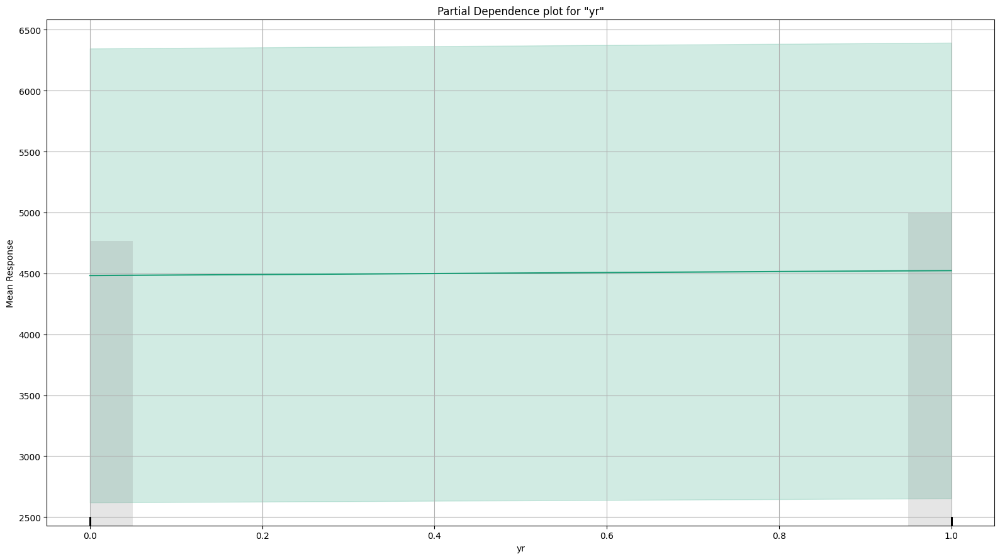

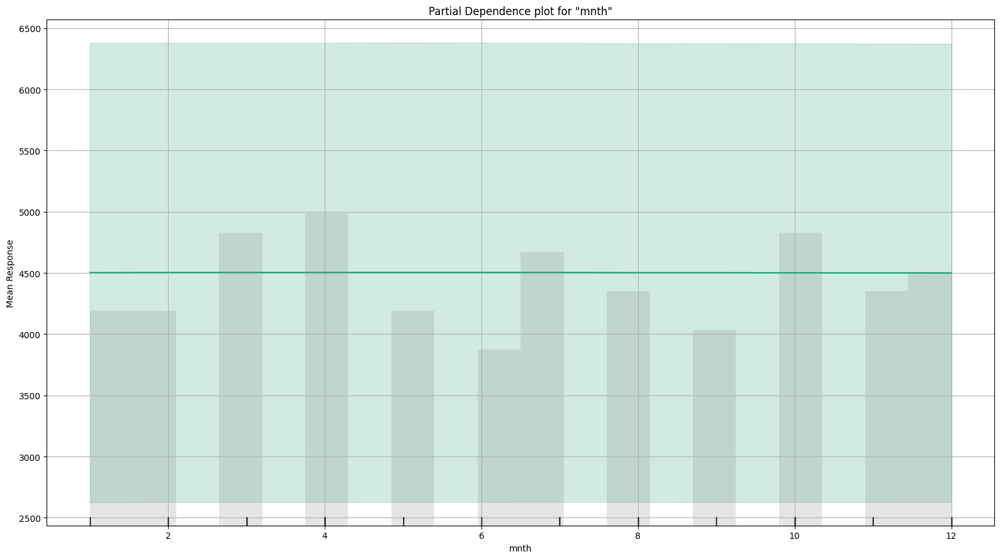

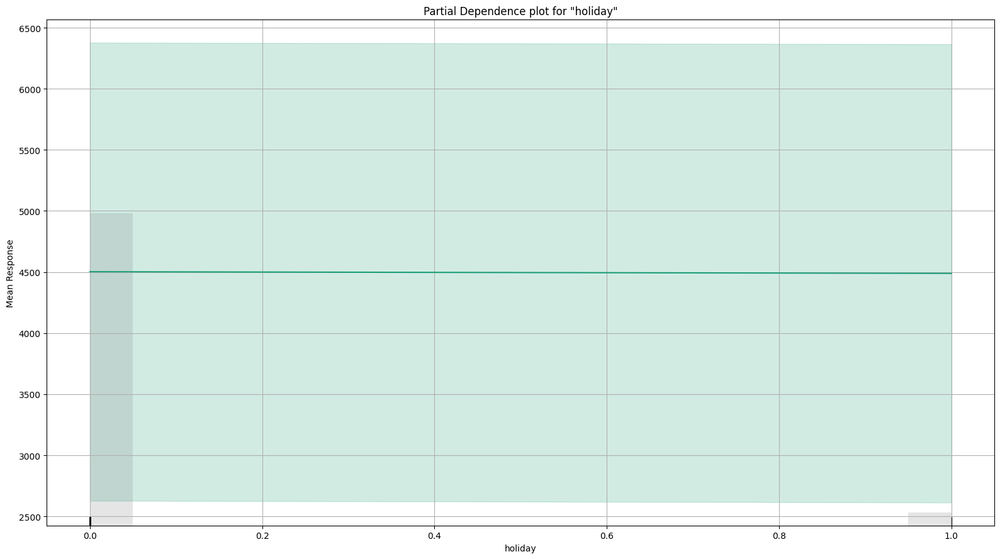

...

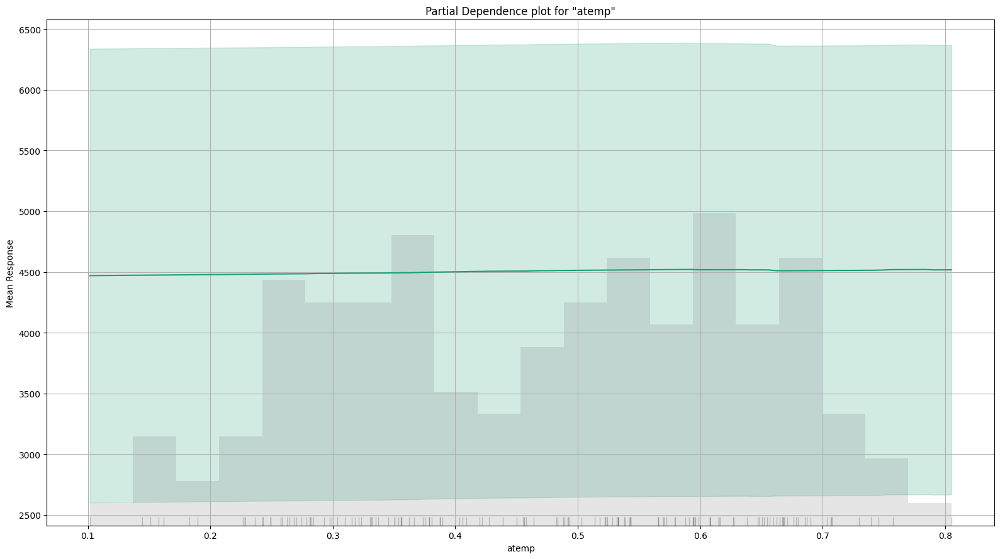

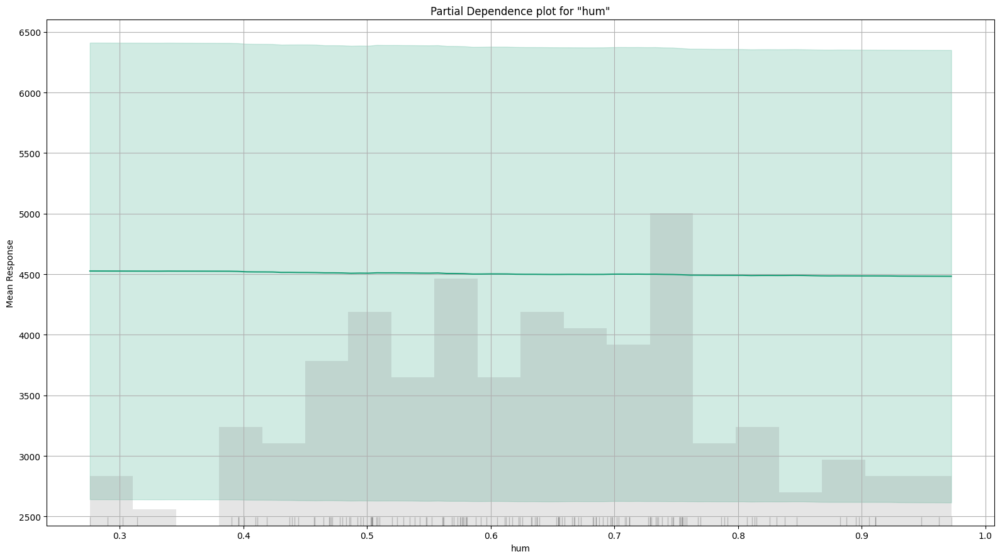

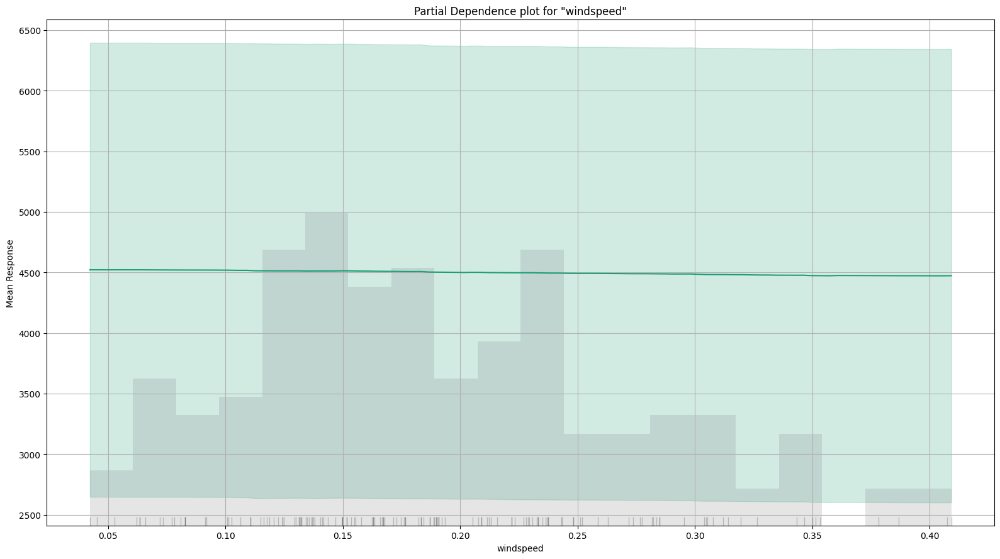

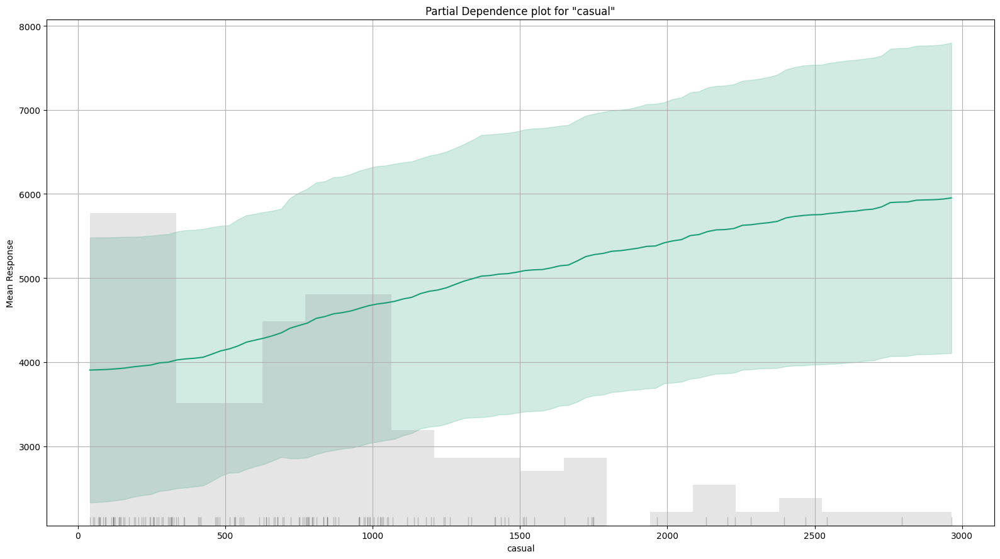

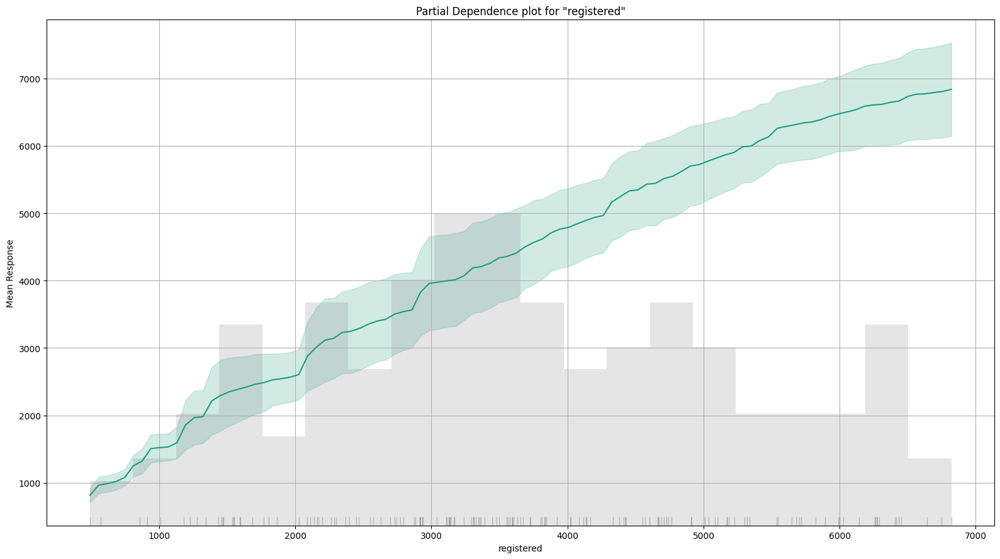

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

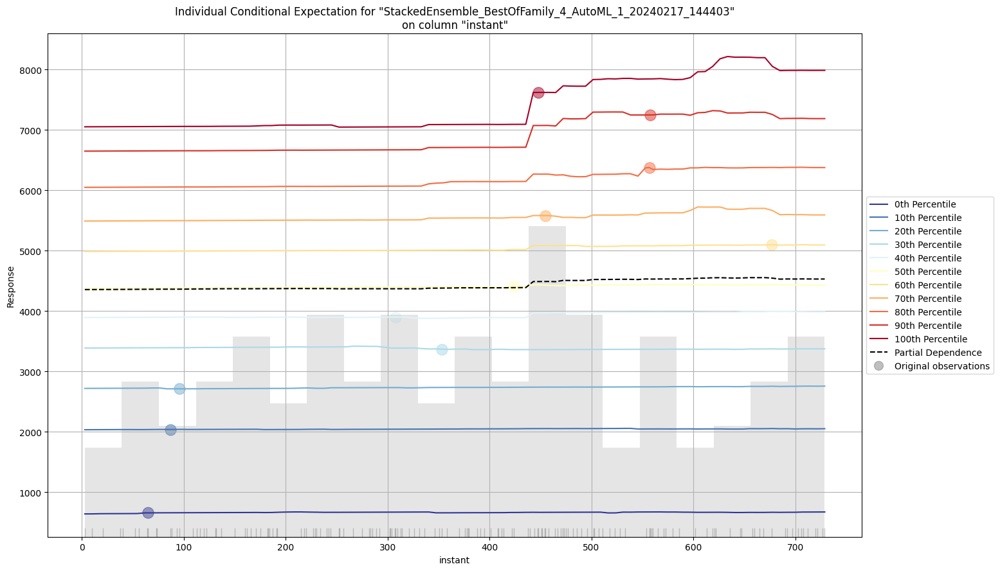

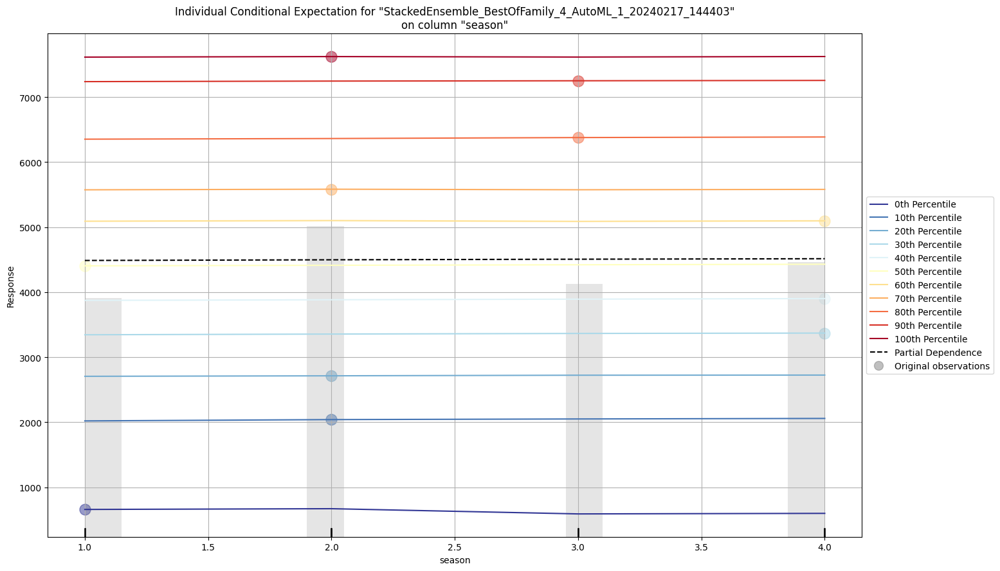

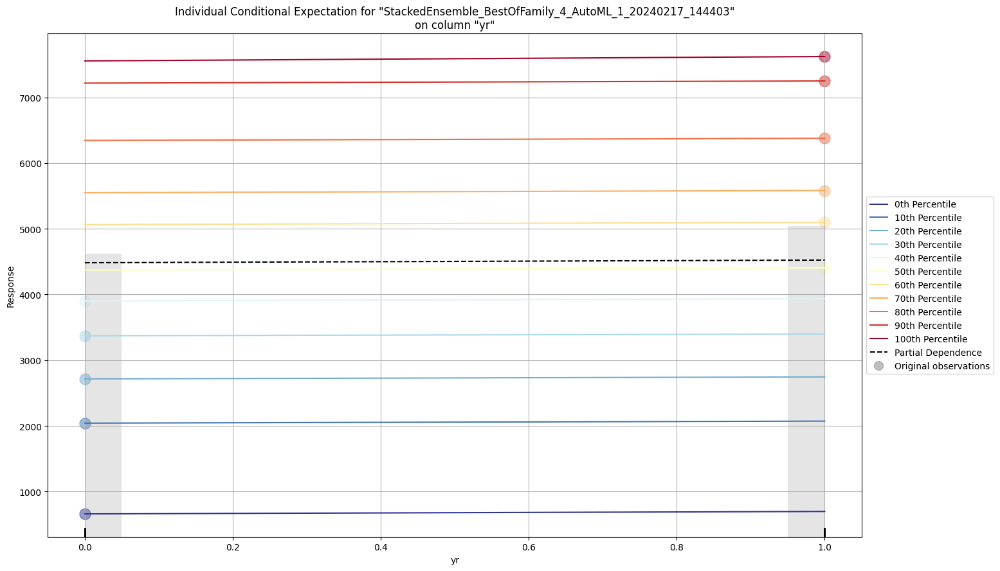

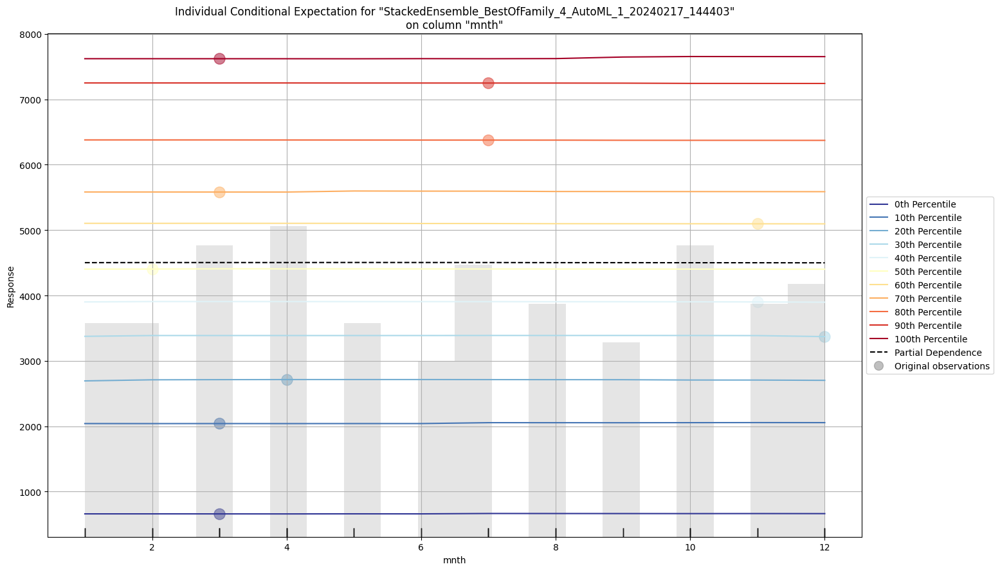

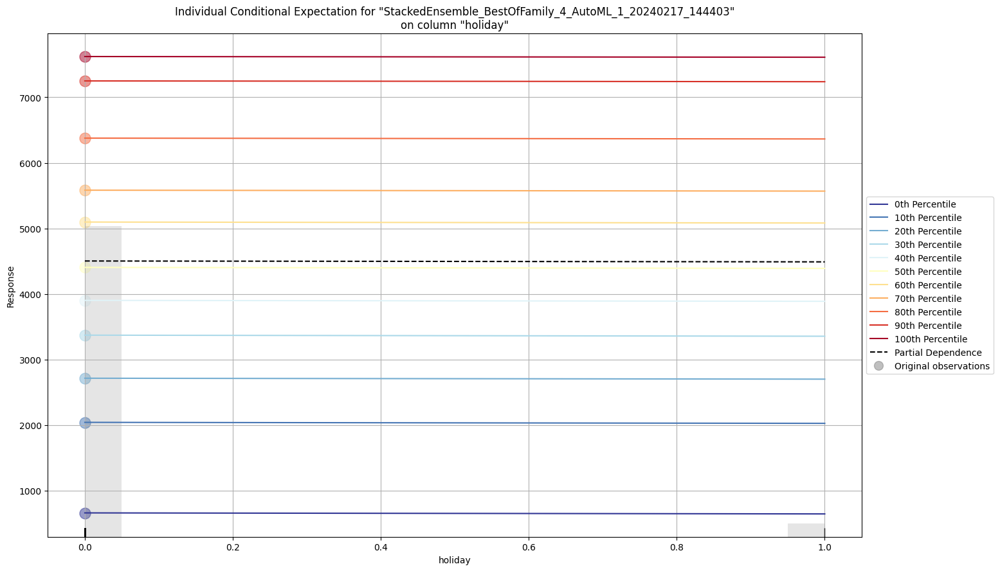

...

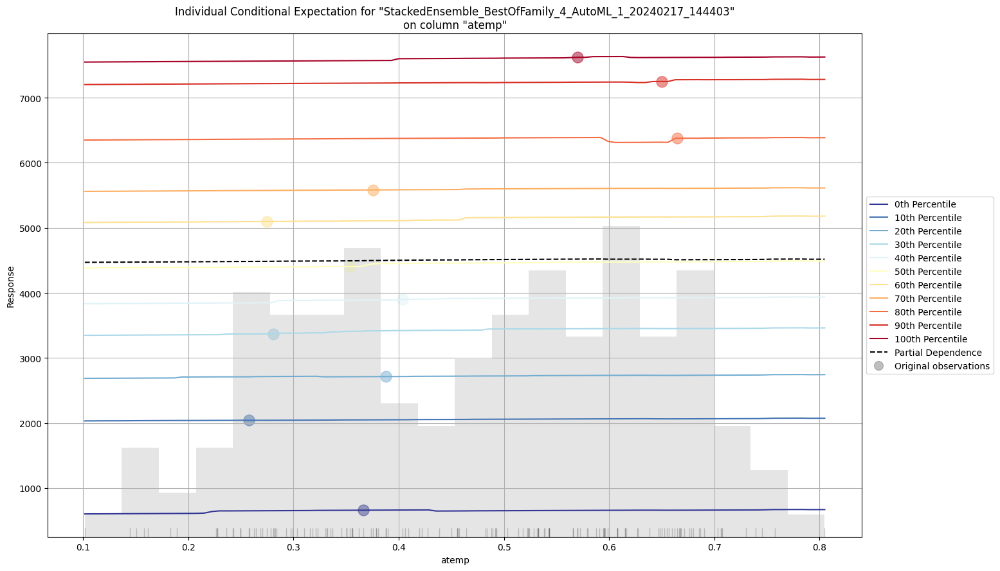

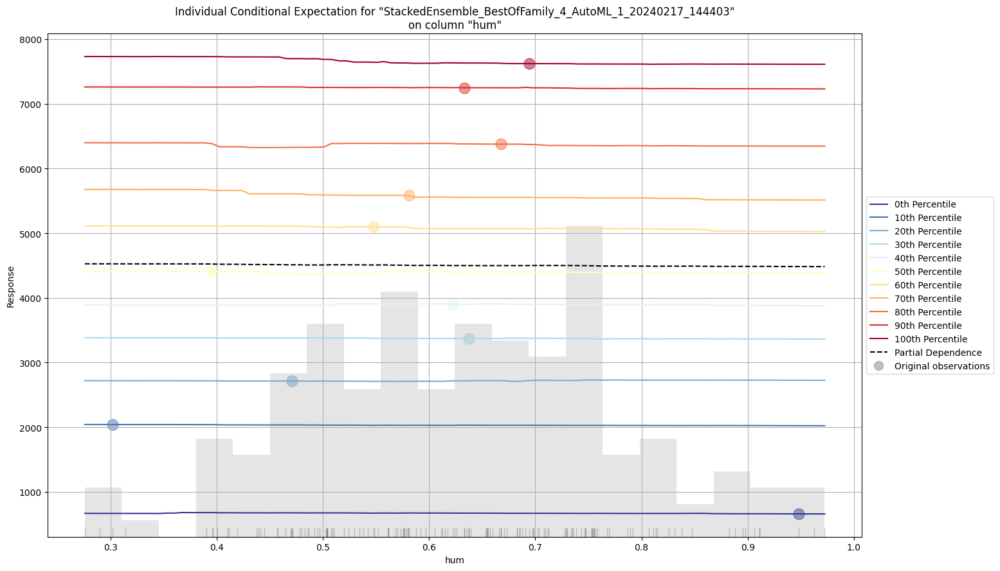

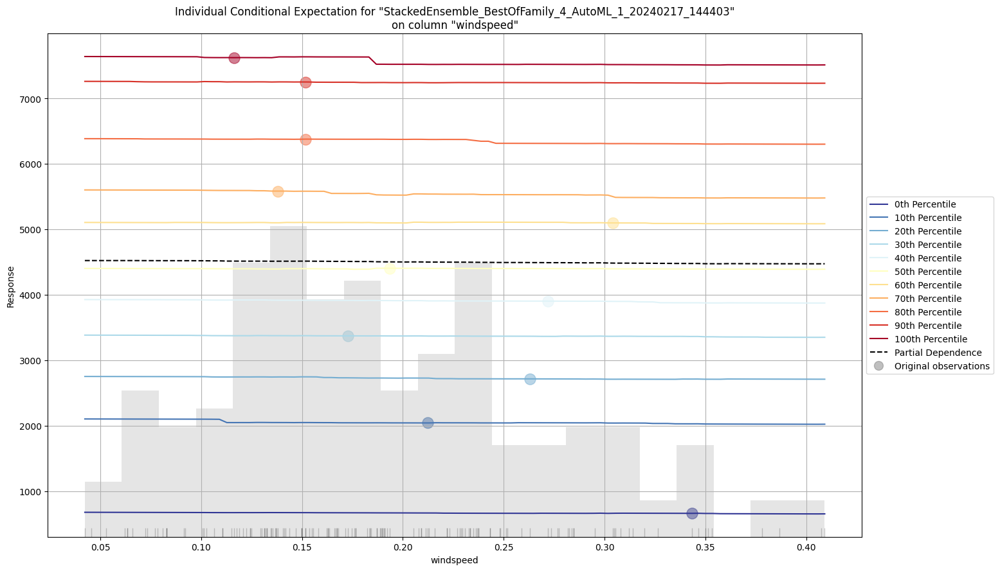

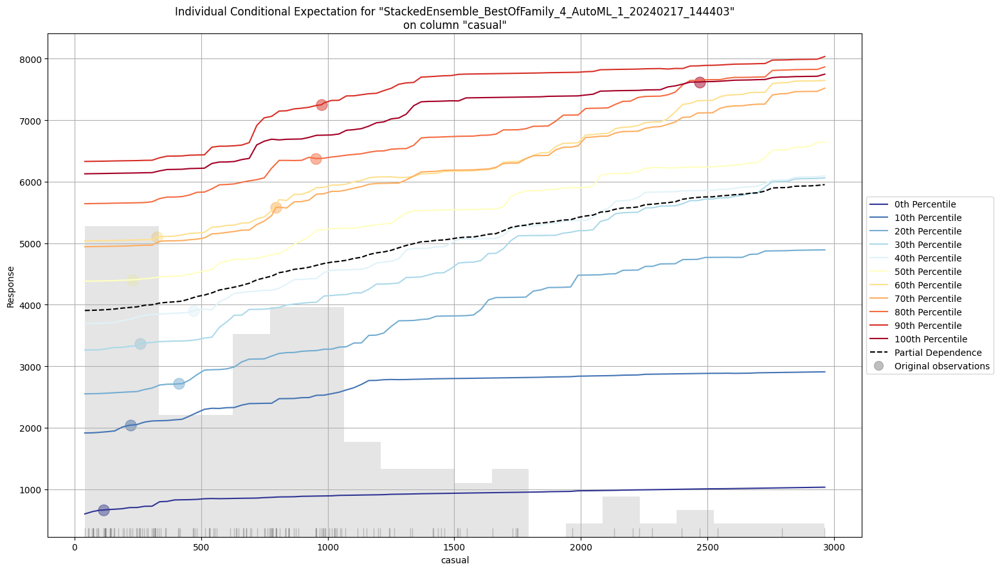

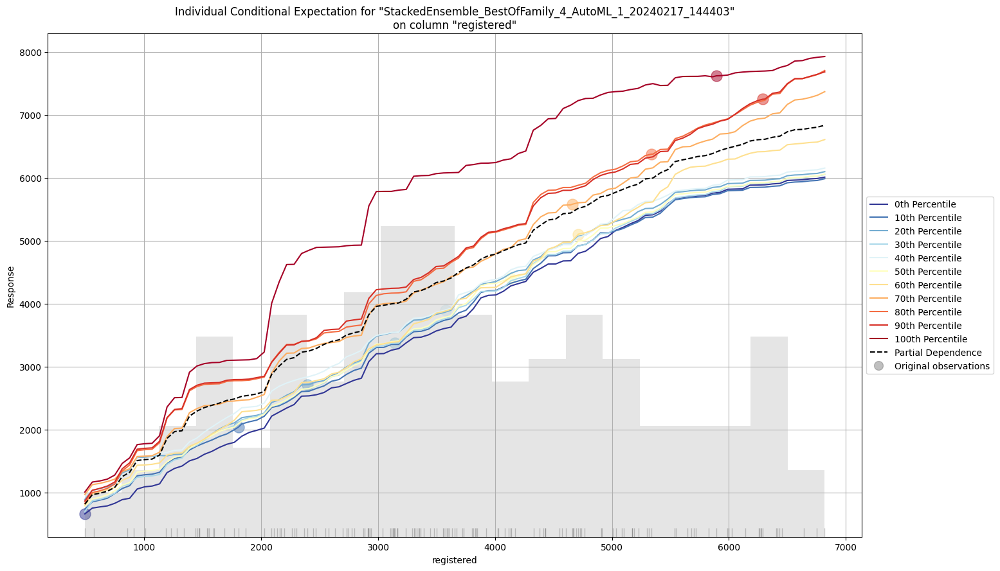

In [9]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm = aml.leader.explain(test_day)

In [10]:
pred = aml.predict(test_day)

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [11]:
pred

predict
1354.34
1362.21
1481.46
1711.95
1600.66
1034.18
1426.78
2049.42
659.64
2016.87


### model 2

In [12]:
from h2o.estimators import H2ORandomForestEstimator

In [13]:
day_drf = H2ORandomForestEstimator()

day_drf.train(y=y, training_frame=train_day)

drf Model Build progress: |

/usr/local/lib/python3.10/dist-packages/h2o/estimators/estimator_base.py:192: RuntimeWarning: Dropping bad and constant columns: [dteday]
  warnings.warn(mesg["message"], RuntimeWarning)


██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2ORandomForestEstimator : Distributed Random Forest
Model Key: DRF_model_python_1708181008418_30


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    50                 50                          229884                 15           20           17.4          343           382           361.56

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 81508.73927224868
RMSE: 285.4973542298574
MAE: 190.0332934697426
RMSLE: 0.22197021100068237
Mean Residual Deviance: 81508.73927224868

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse       training_mae        training_deviance
---  -------------------  ----------  -----------------  ------------------  ------------------  -------------------
     2024-02-17 15:02:21  0.009 sec   0.0                nan                 nan                 nan
     2024-02-17 15:02:21  0.043 sec   1.0                588.7176018657365   394.9585253456221   346588.4147465438
     2024-02-17 15:02:21  0.053 sec   2.0                605.437859878215    394.8101449275362   366555.00217391306
     2024-02-17 15:02:21  0.067 sec   3.0                550.294332352269    357.346551724138    302823.8522190294
     2024-02-17 15:02:21  0.084 sec   4.0                505.42285094587703  330.8135828135828   255452.25825825825
     2024-02-17 15:02:21  0.098 sec   5.0                499.2198643436787   325.2633077415226   249220.47295532093
     2024-02-17 15:02:21  0.110 sec   6.0                506.93120721917535  328.5808379544054   256979.24885269048
     2024-02-17 15:02:21  0.123 sec   7.0                488.03262656302593  328.0297449584817   238175.8445900059
     2024-02-17 15:02:21  0.135 sec   8.0                461.5549127098042   310.0436004031243   213032.93744655498
     2024-02-17 15:02:21  0.147 sec   9.0                441.3220903265481   296.51013153513156  194765.18741019387
---  ---                  ---         ---                ---                 ---                 ---
     2024-02-17 15:02:21  0.599 sec   41.0               280.752321640517    190.16563409861692  78821.8661065403
     2024-02-17 15:02:21  0.621 sec   42.0               278.01502794650906  187.52323458434861  77292.3557640982
     2024-02-17 15:02:21  0.634 sec   43.0               277.5362362418701   186.85537688593786  77026.36242730313
     2024-02-17 15:02:21  0.652 sec   44.0               277.32774692382503  187.0116936253073   76910.67921384516
     2024-02-17 15:02:21  0.675 sec   45.0               278.16484070332496  187.60106719620006  77375.67860350615
     2024-02-17 15:02:22  0.696 sec   46.0               279.27336458042174  188.39326774102247  77993.61216406916
     2024-02-17 15:02:22  0.709 sec   47.0               278.84337044403117  187.71513346823292  77753.62524058718
     2024-02-17 15:02:22  0.722 sec   48.0               278.63532967629357  186.33977002116418  77637.6469438168
     2024-02-17 15:02:22  0.740 sec   49.0               282.1794579808477   188.81483774047362  79625.246506365
     2024-02-17 15:02:22  0.752 sec   50.0               285.4973542298574   190.0332934697426   81508.73927224868
[51 rows x 7 columns]


Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
registered  3.70459e+10            1                    0.421162
instant     1.37313e+10            0.370656             0.156106
casual      1.34553e+10            0.363207             0.152969
temp        9.34324e+09            0.252207             0.10622
yr          3.78552e+09            0.102185             0.0430363
atemp       3.49674e+09            0.0943894       

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

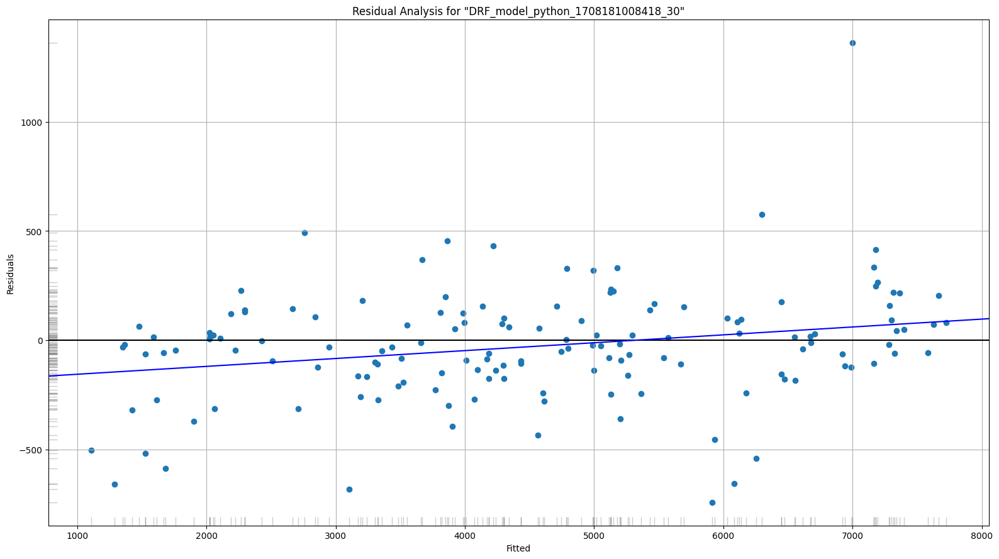

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

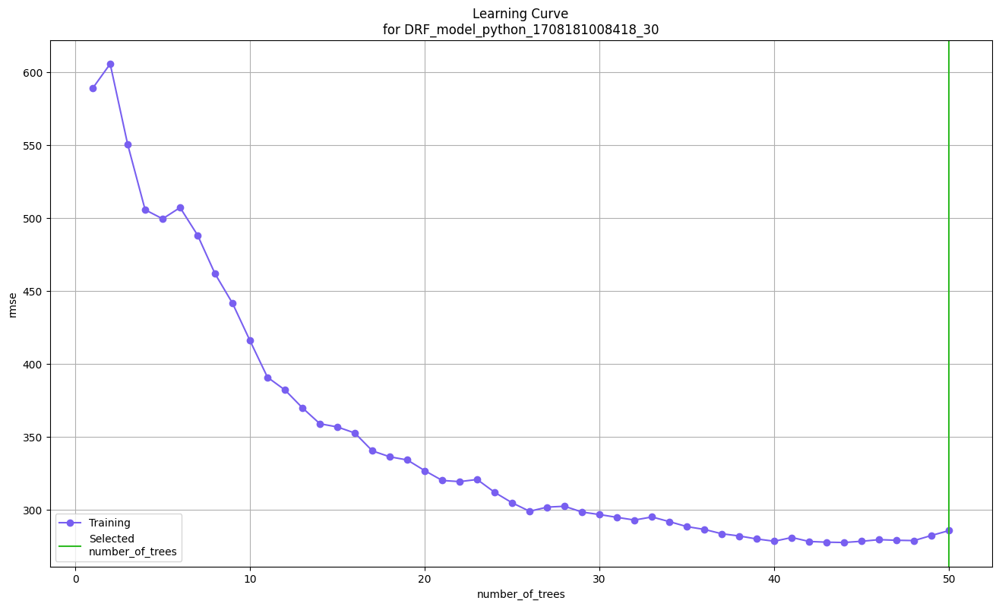

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

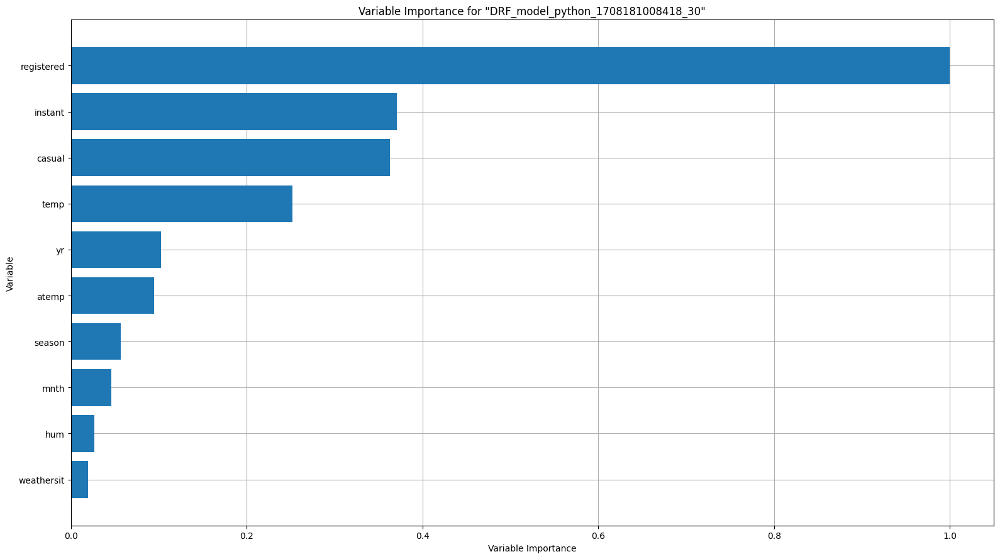

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

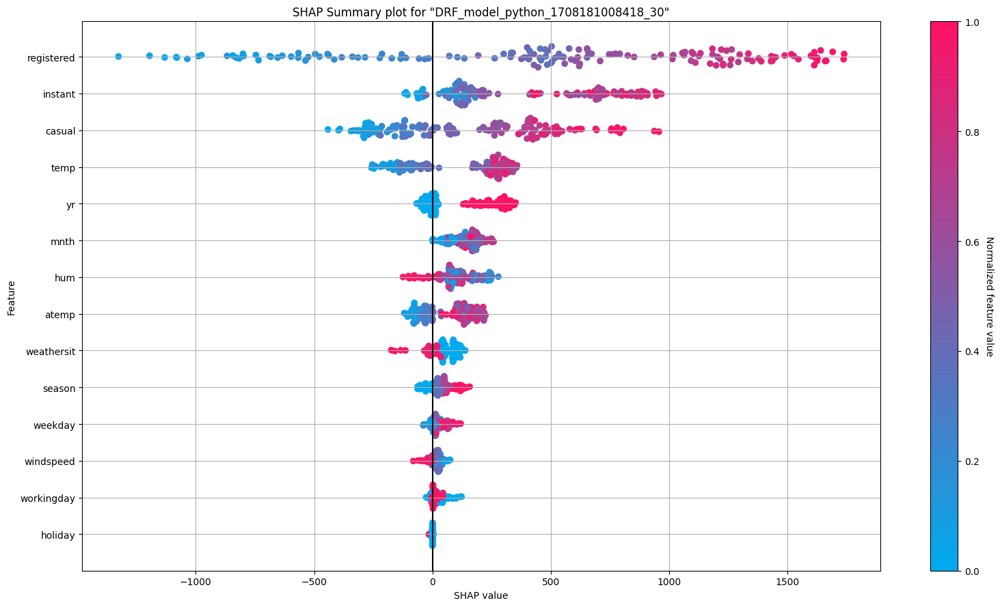

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

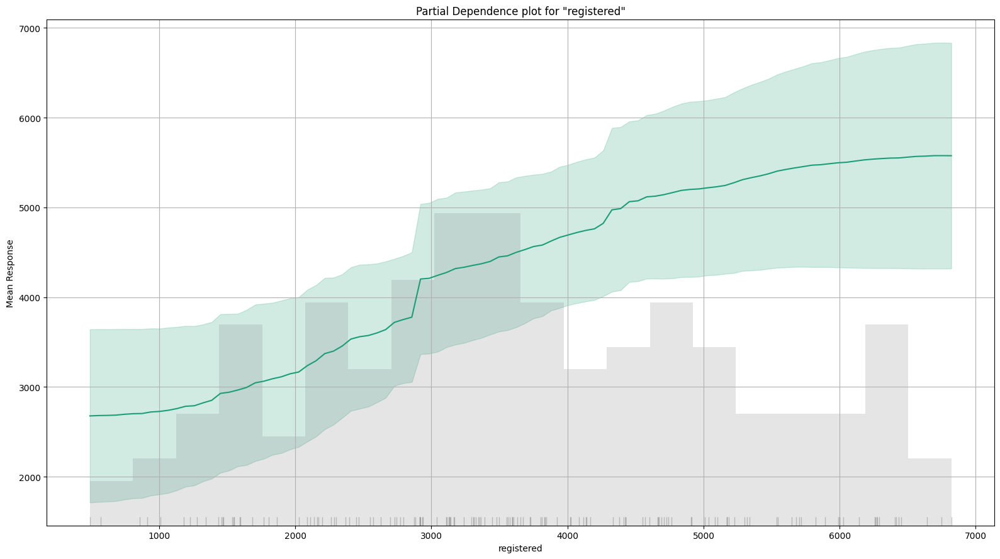

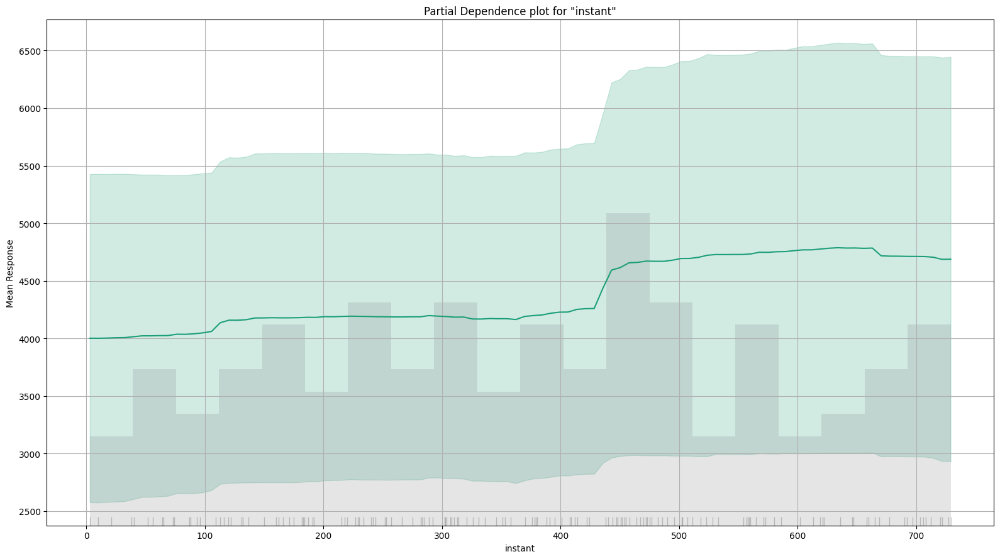

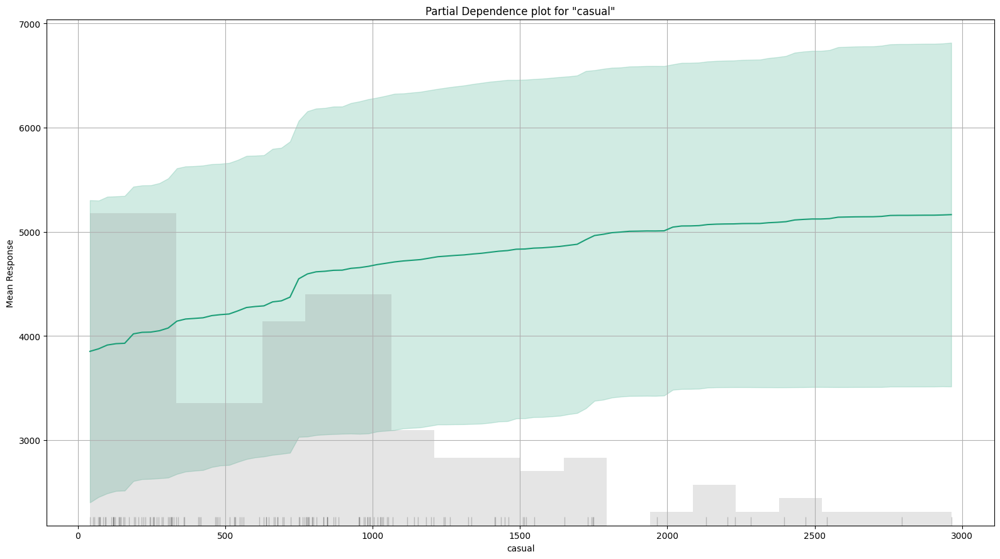

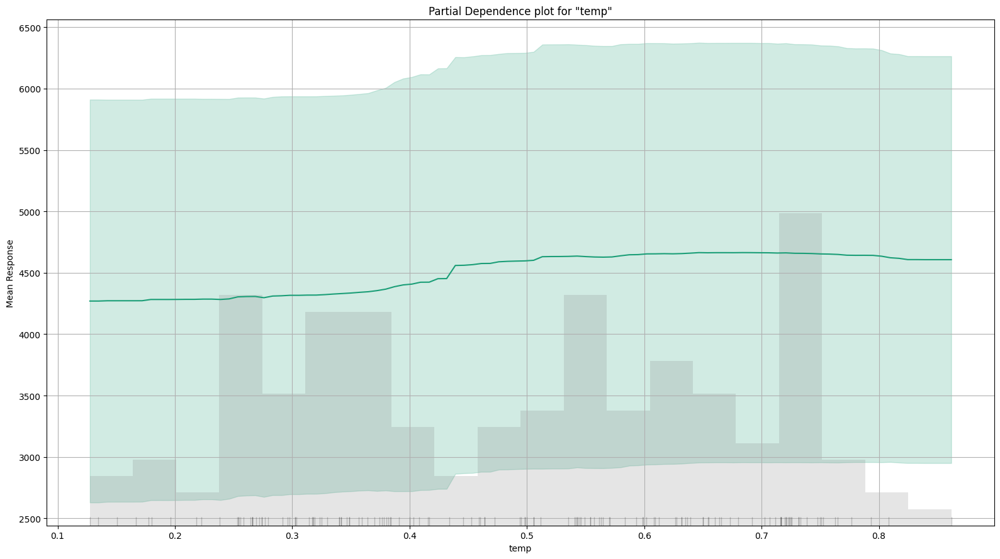

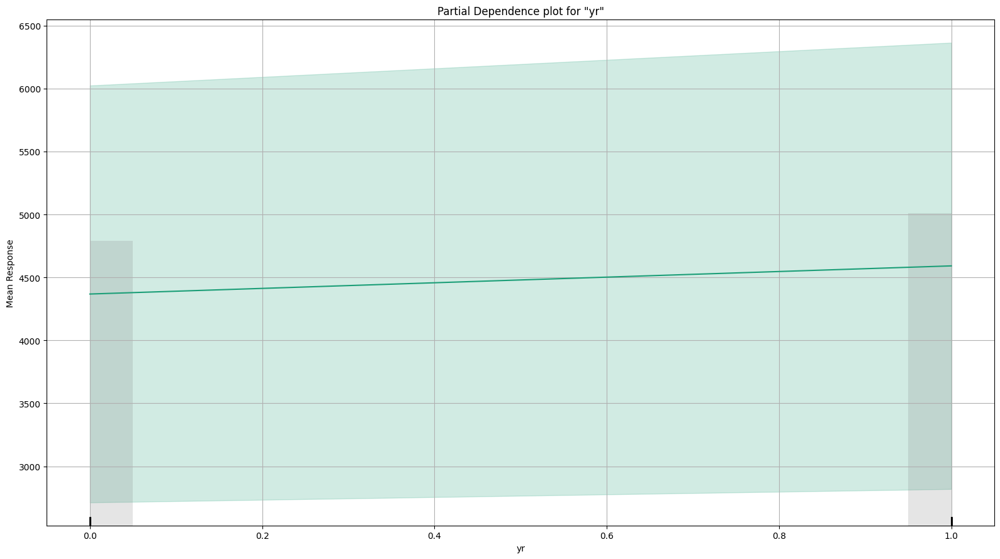

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

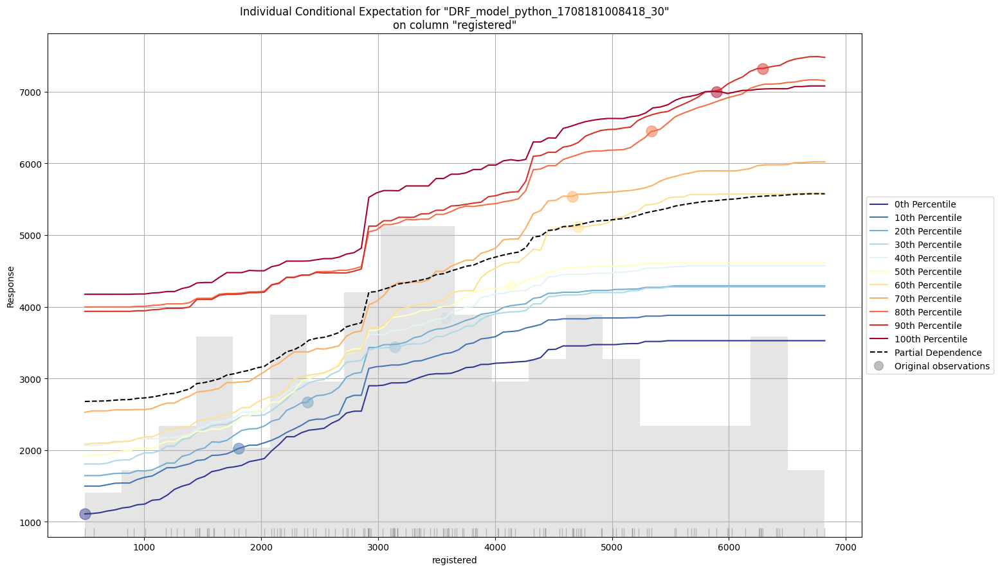

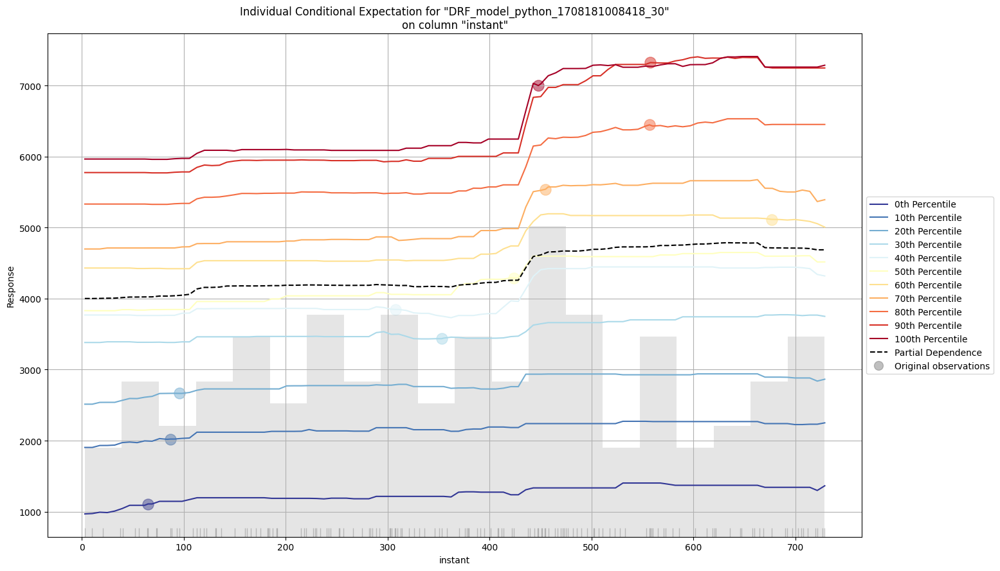

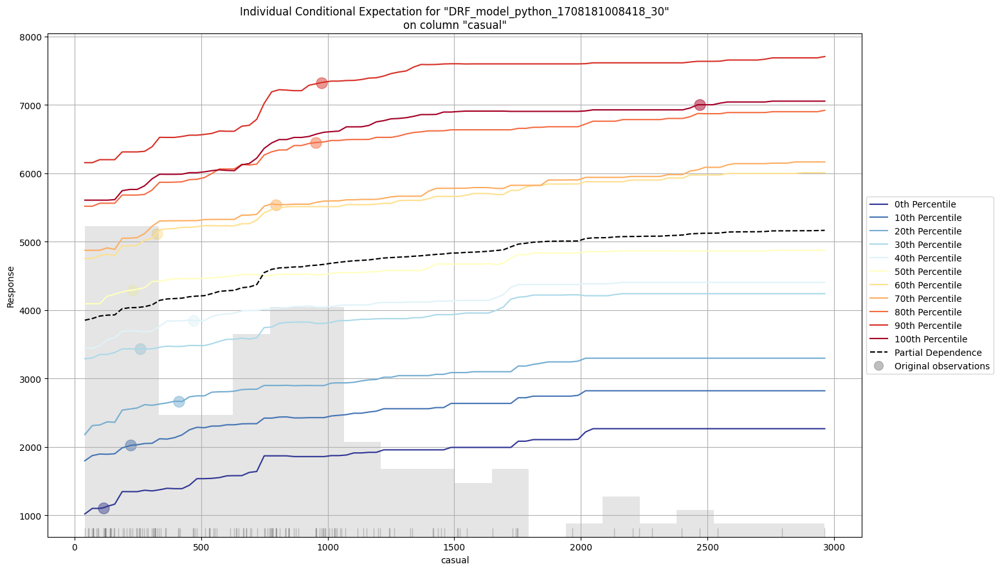

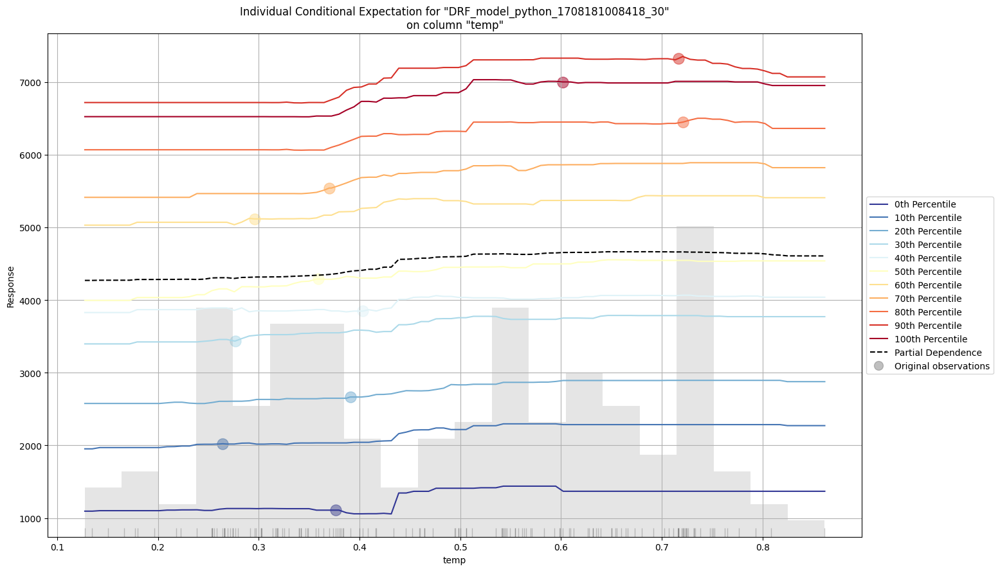

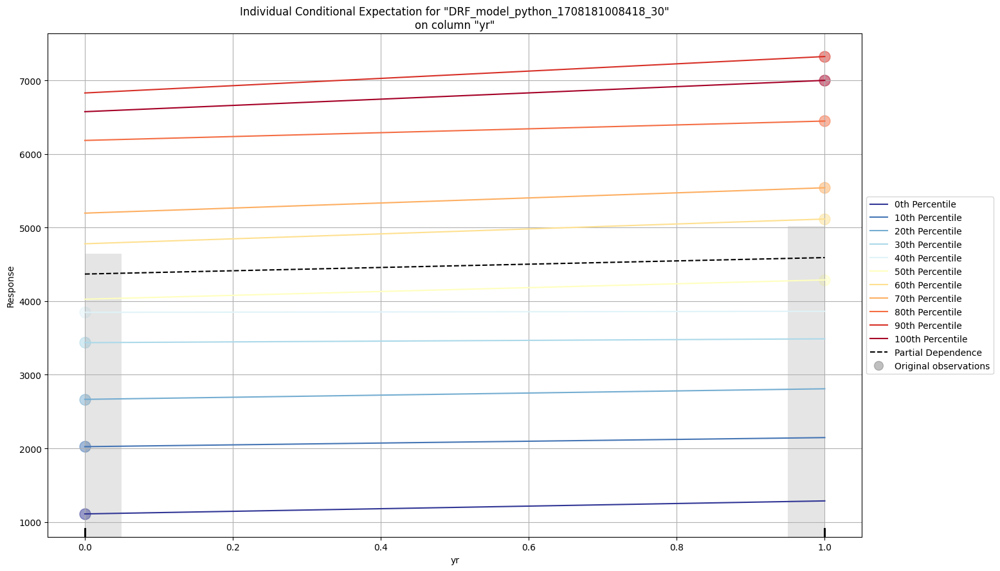

In [14]:
exp = day_drf.explain(test_day)

In [15]:
perf = day_drf.model_performance()

In [16]:
perf

ModelMetricsRegression: drf
** Reported on train data. **

MSE: 81508.73927224868
RMSE: 285.4973542298574
MAE: 190.0332934697426
RMSLE: 0.22197021100068237
Mean Residual Deviance: 81508.73927224868

In [17]:
pred1 = day_drf.predict(test_day)

pred1

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


predict
1368.32
1354.18
1480.34
1758.58
1589.86
1426.08
1525.5
2053.12
1108.74
2030.34


### testing model on hour dataset

In [18]:
# Run AutoML for 10 minutes
aml1 = H2OAutoML(max_runtime_secs=600, seed=1)
aml1.train(y=y, training_frame=train_hour)

AutoML progress: |
15:03:33.9: _train param, Dropping bad and constant columns: [dteday]

█
15:03:36.836: _train param, Dropping bad and constant columns: [dteday]
15:03:37.190: _train param, Dropping bad and constant columns: [dteday]

█
15:03:38.880: _train param, Dropping unused columns: [dteday]
15:03:39.13: _train param, Dropping bad and constant columns: [dteday]

██
15:03:41.688: _train param, Dropping bad and constant columns: [dteday]

██
15:03:44.442: _train param, Dropping bad and constant columns: [dteday]

██
15:03:48.679: _train param, Dropping bad and constant columns: [dteday]

█
15:03:53.487: _train param, Dropping bad and constant columns: [dteday]

█
15:03:55.955: _train param, Dropping unused columns: [dteday]
15:03:56.90: _train param, Dropping unused columns: [dteday]
15:03:56.251: _train param, Dropping bad and constant columns: [dteday]

█
15:03:58.276: _train param, Dropping bad and constant columns: [dteday]

██
15:04:02.12: _train param, Dropping bad and cons

key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),1/1
# DeepLearning base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_2_20240217_150332_model_59,93.1523,8677.35,66.9168,0.0309652,8677.35,379,0.026677,GBM
GBM_grid_1_AutoML_2_20240217_150332_model_12,102.693,10545.8,69.0987,0.0259967,10545.8,298,0.023362,GBM
GBM_grid_1_AutoML_2_20240217_150332_model_51,103.076,10624.7,63.5736,0.0364295,10624.7,420,0.03555,GBM
GBM_grid_1_AutoML_2_20240217_150332_model_43,103.456,10703,74.2977,0.0345611,10703,385,0.04154,GBM
StackedEnsemble_BestOfFamily_5_AutoML_2_20240217_150332,107.313,11516,78.6803,0.0304245,11516,1048,0.125501,StackedEnsemble
GBM_grid_1_AutoML_2_20240217_150332_model_50,108.278,11724.1,70.7343,0.0353118,11724.1,584,0.033699,GBM
GBM_grid_1_AutoML_2_20240217_150332_model_5,110.504,12211.1,75.2453,0.0338933,12211.1,425,0.059218,GBM
StackedEnsemble_BestOfFamily_4_AutoML_2_20240217_150332,116.329,13532.4,76.6121,0.0309692,13532.4,133,0.051419,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20240217_150332,116.432,13556.4,81.7634,0.0365547,13556.4,289,0.068028,StackedEnsemble
GBM_grid_1_AutoML_2_20240217_150332_model_44,117.215,13739.4,74.4341,0.0385557,13739.4,517,0.026806,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

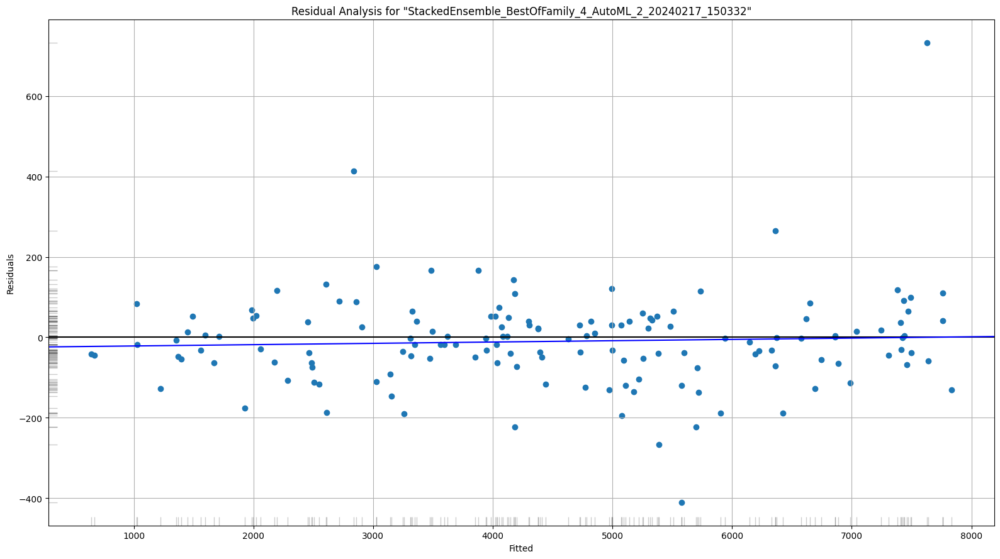

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

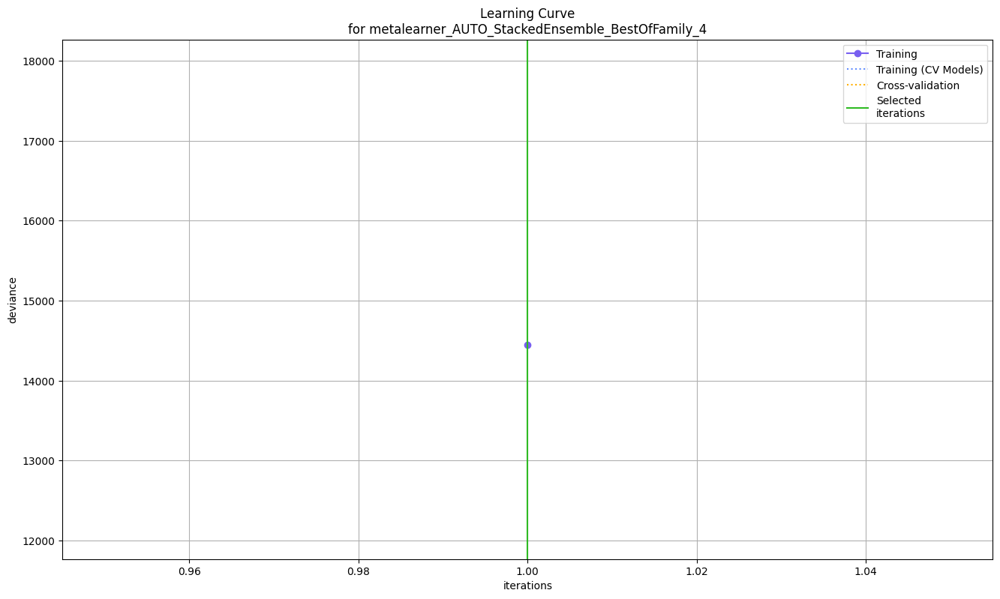

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

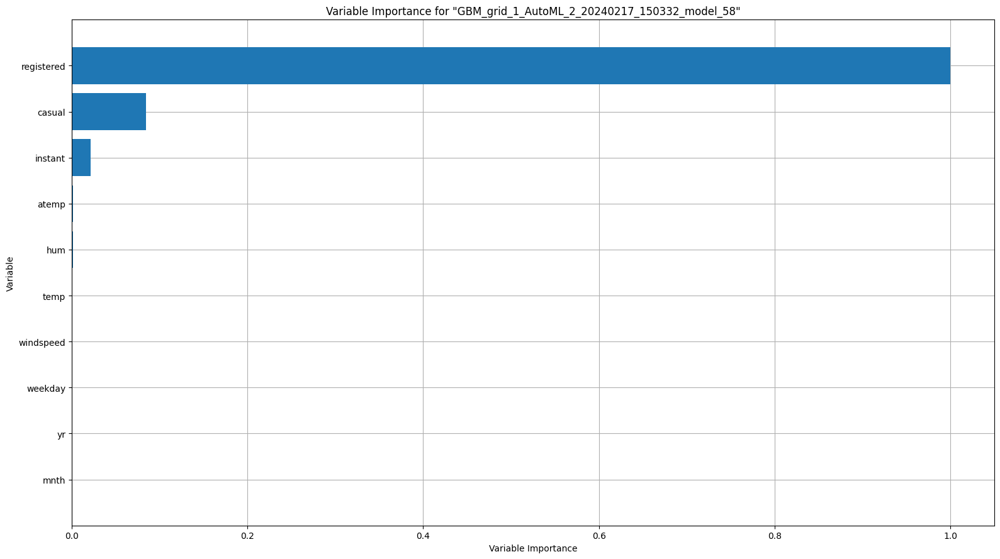

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

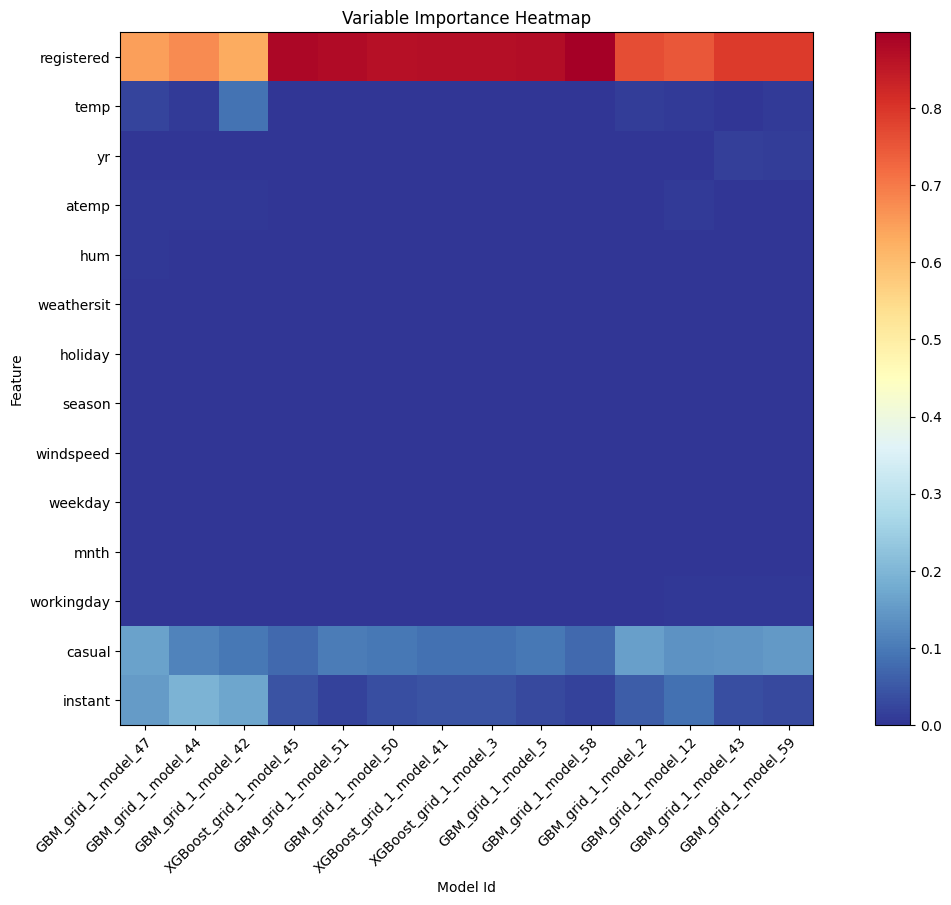

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

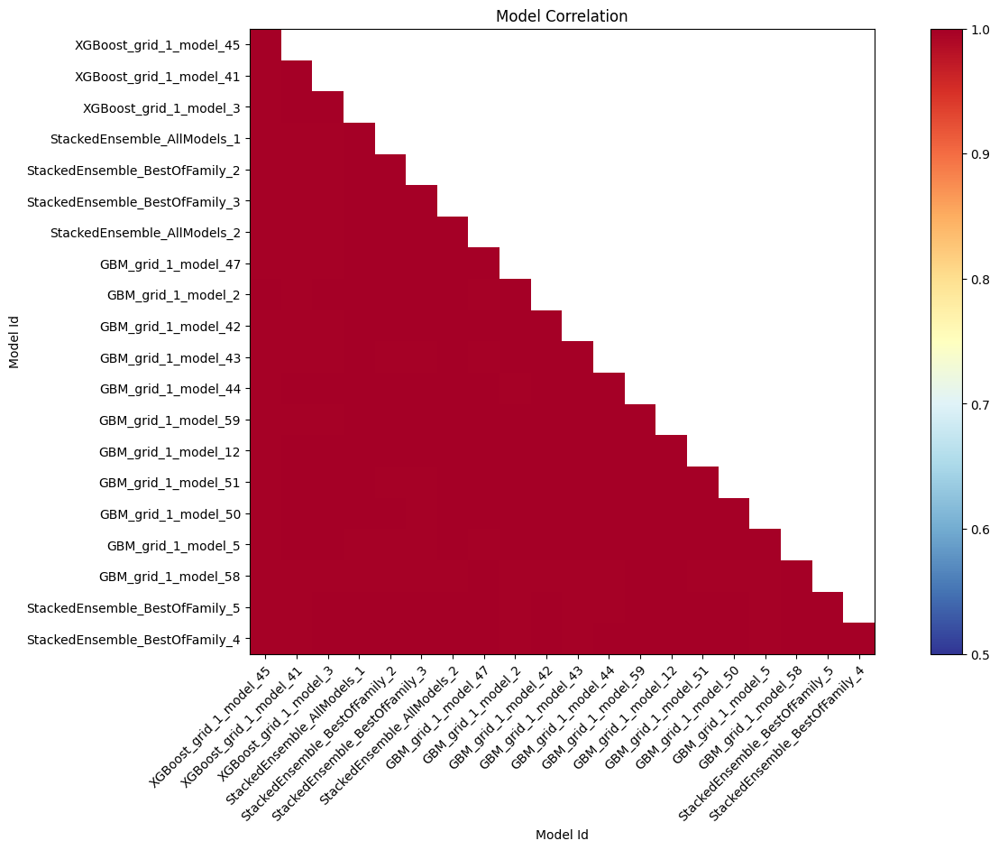

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

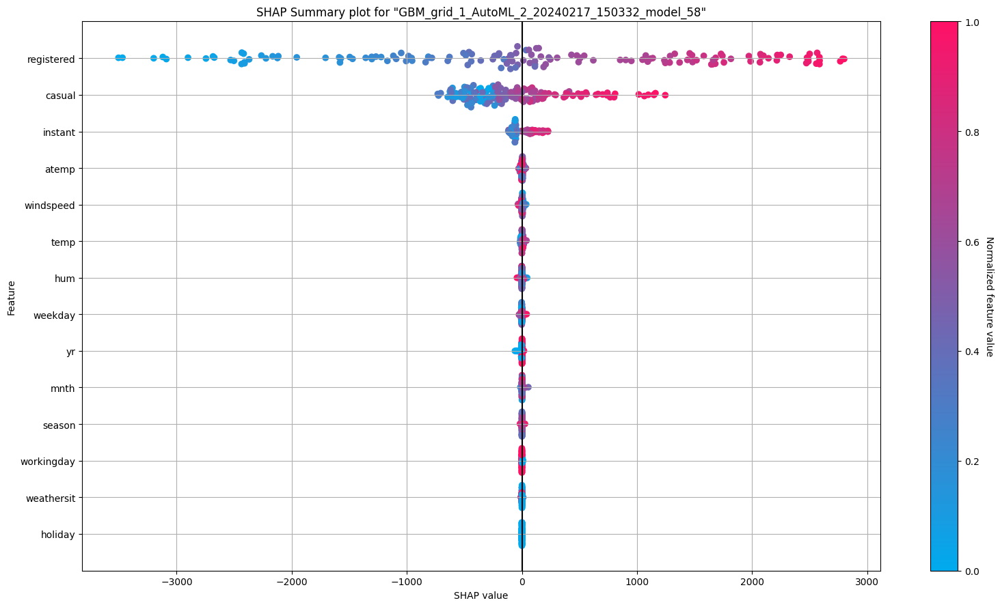

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

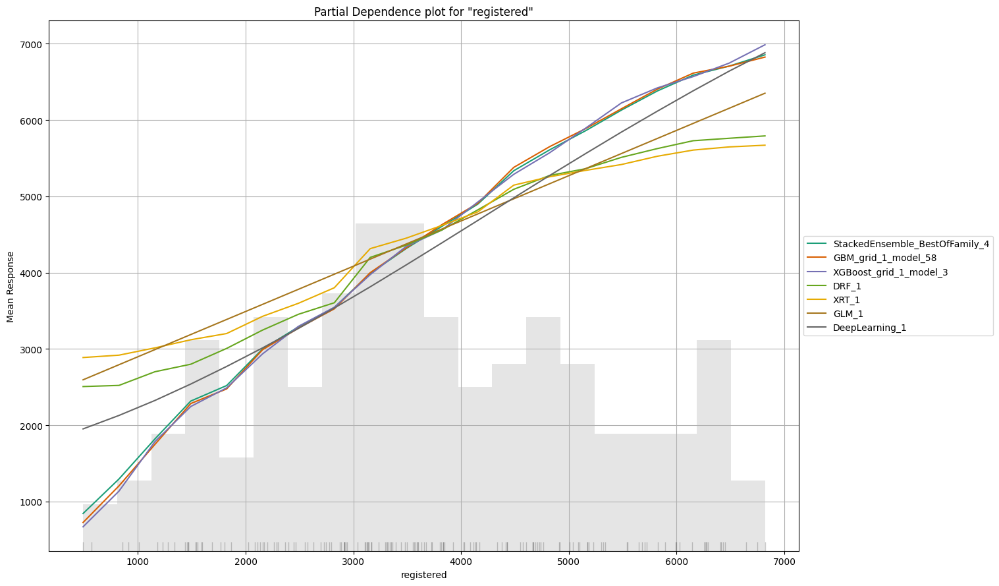

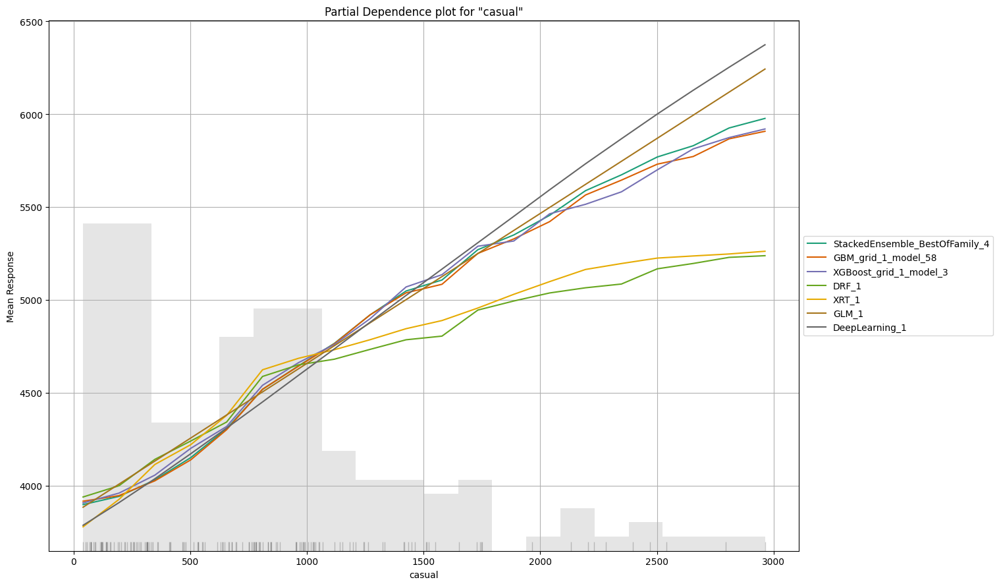

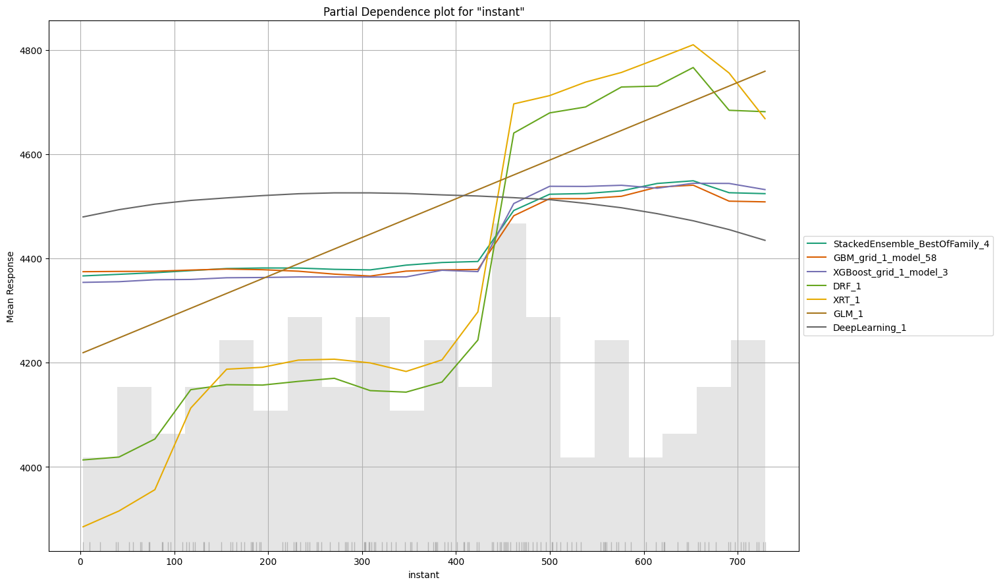

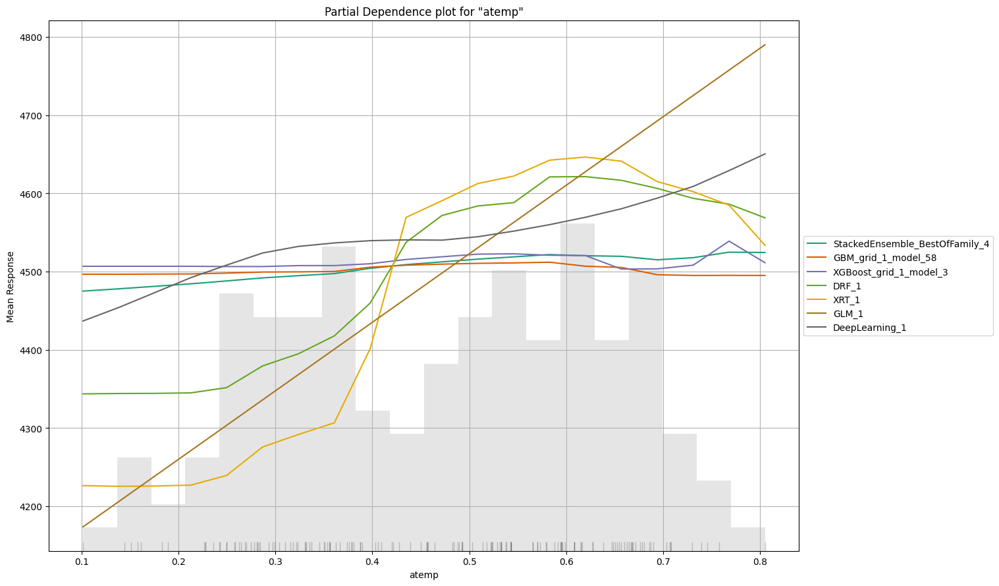

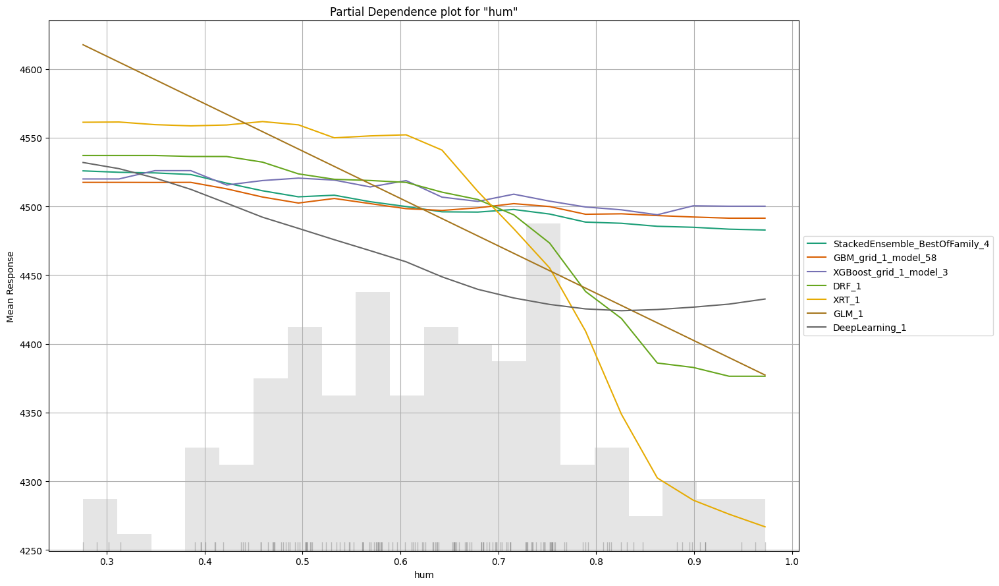

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

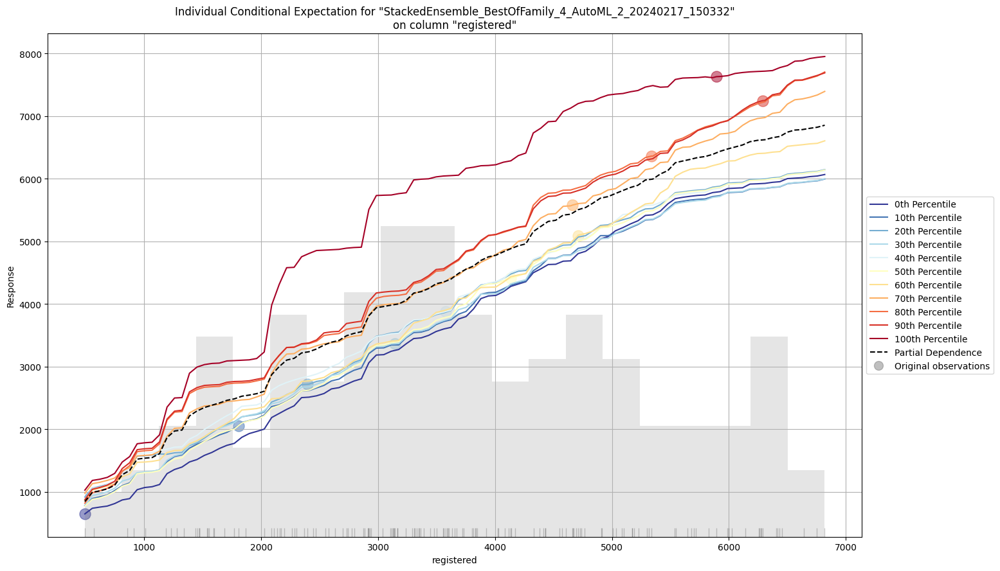

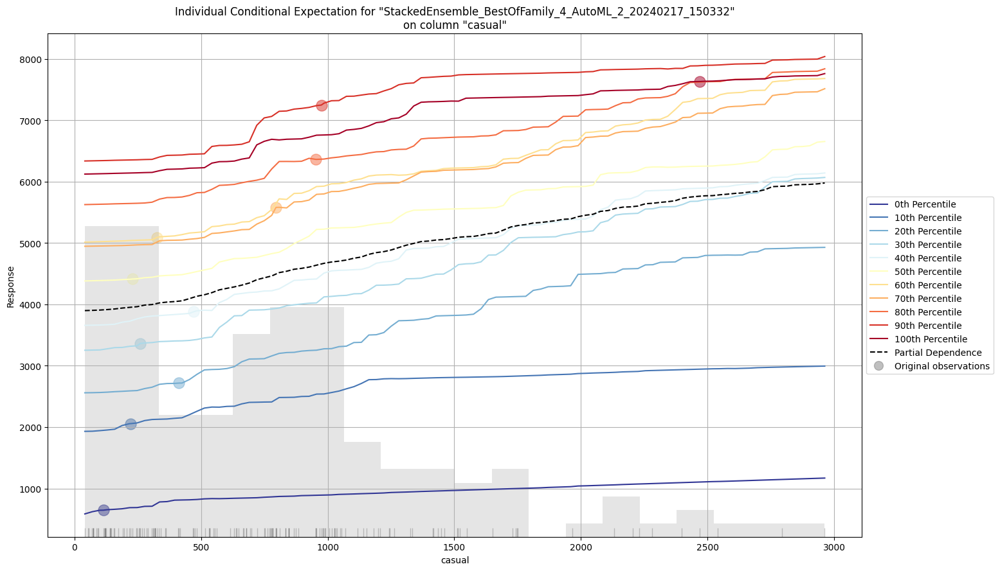

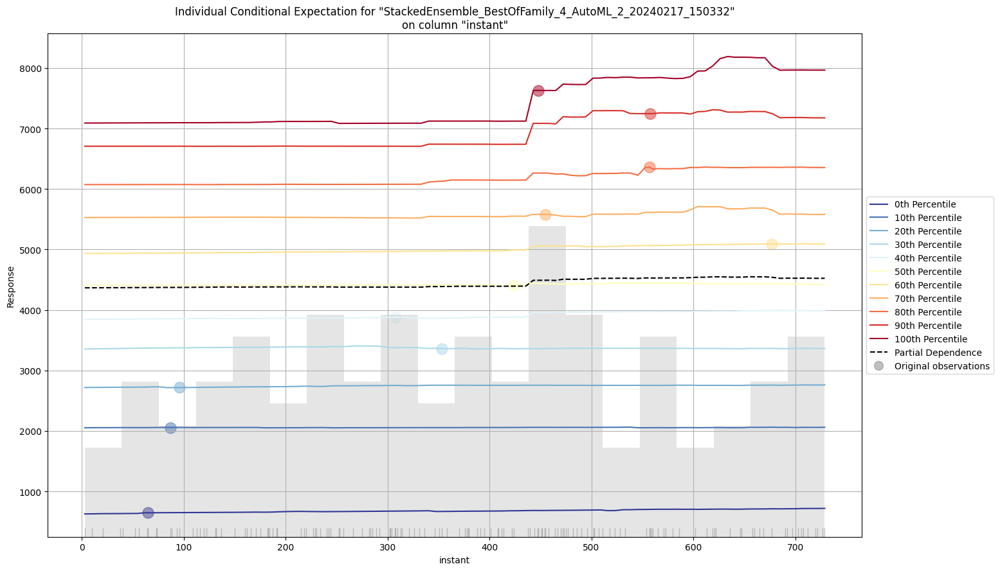

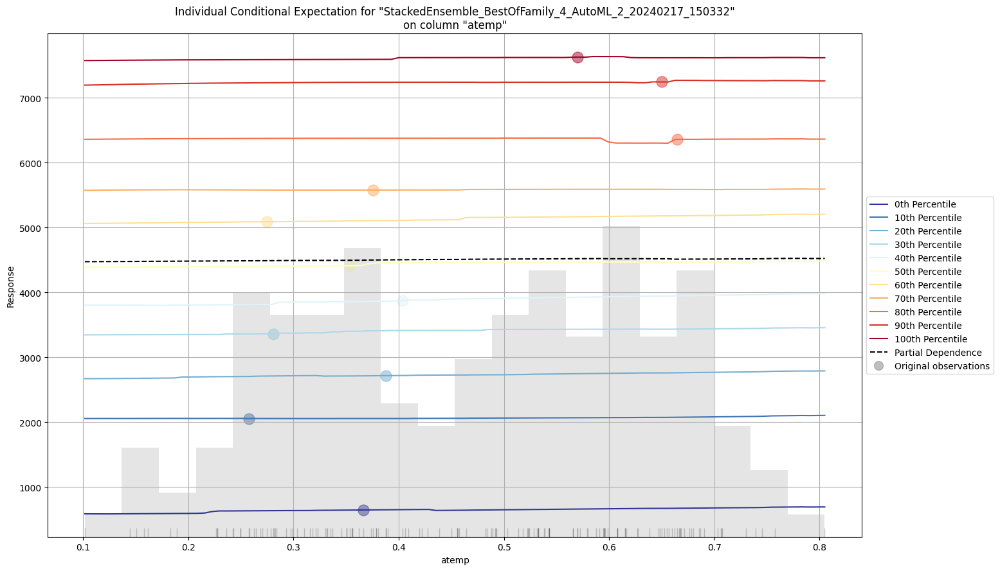

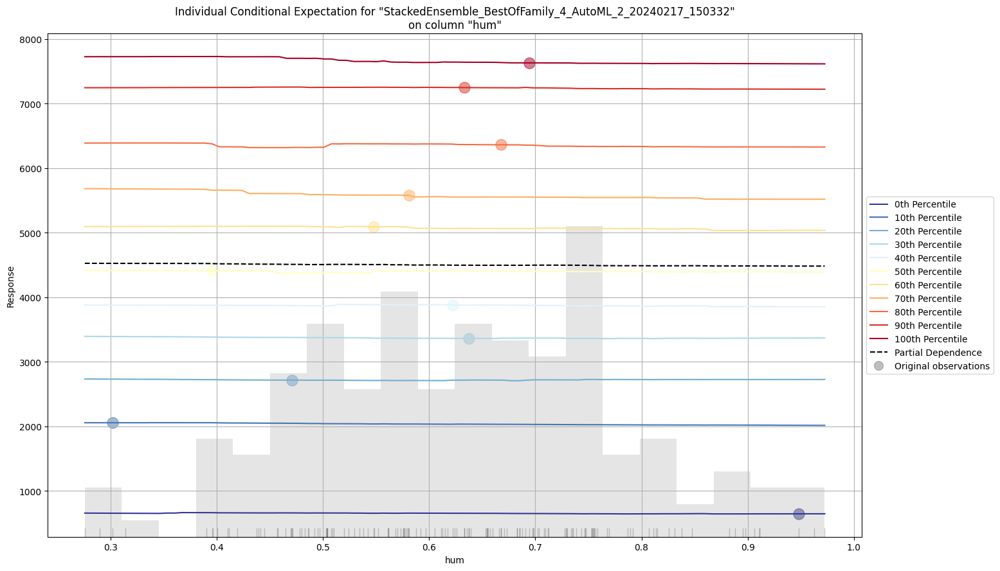

In [19]:
# Explain leader model & compare with all AutoML models
exa1 = aml1.explain(test_hour)

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

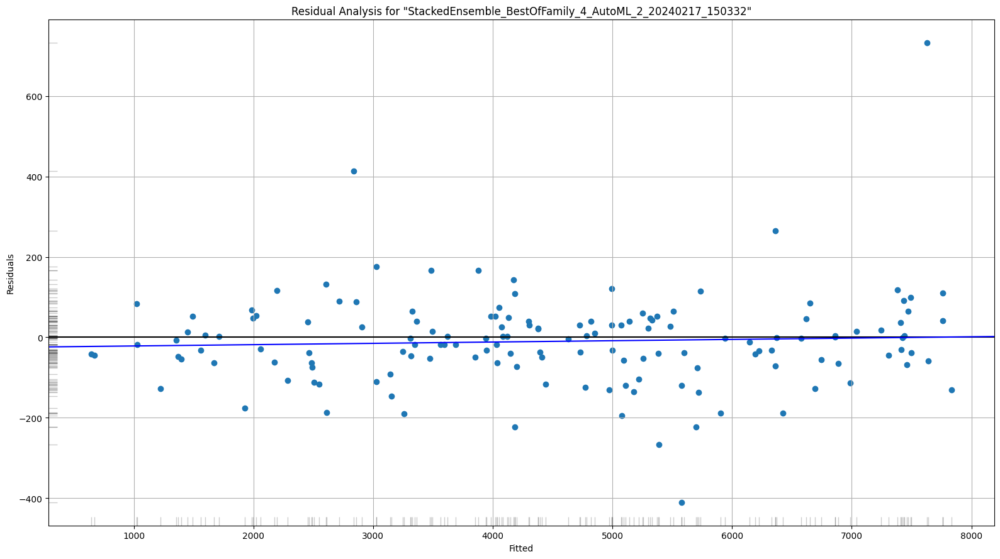

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

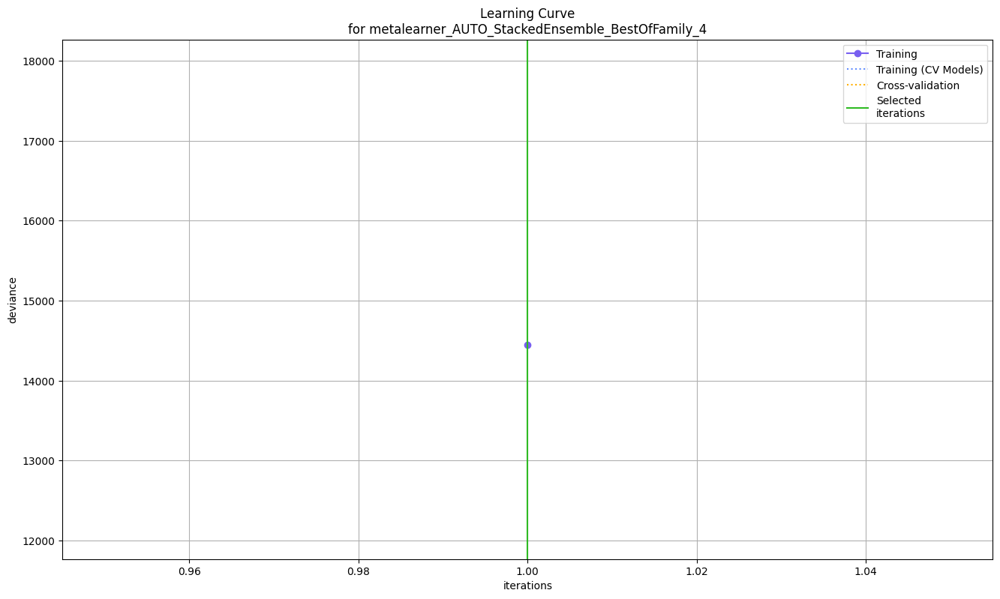

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

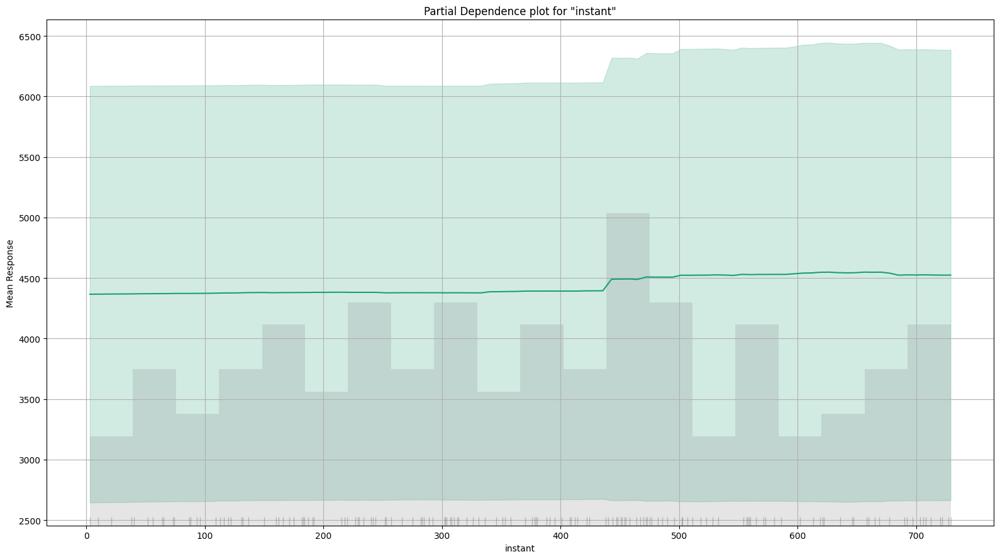

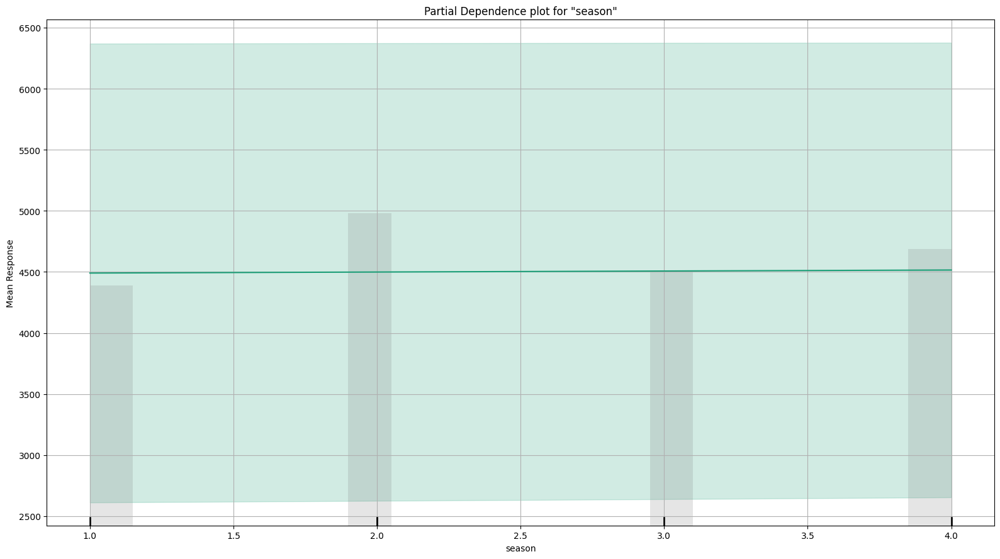

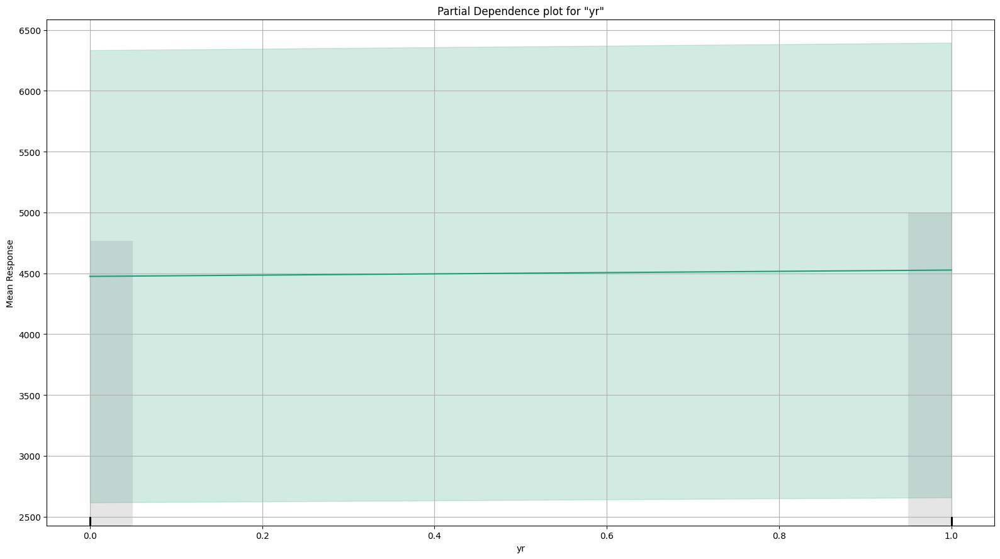

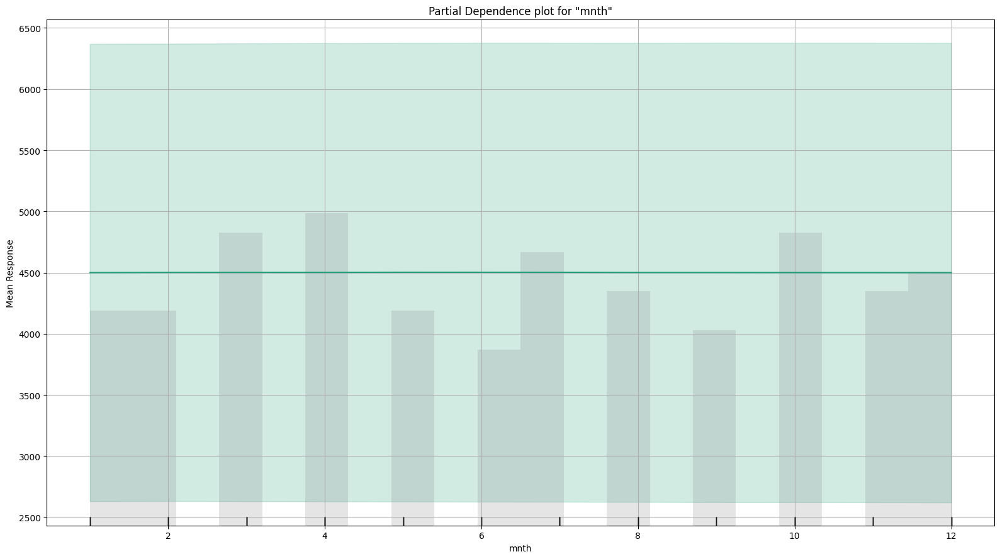

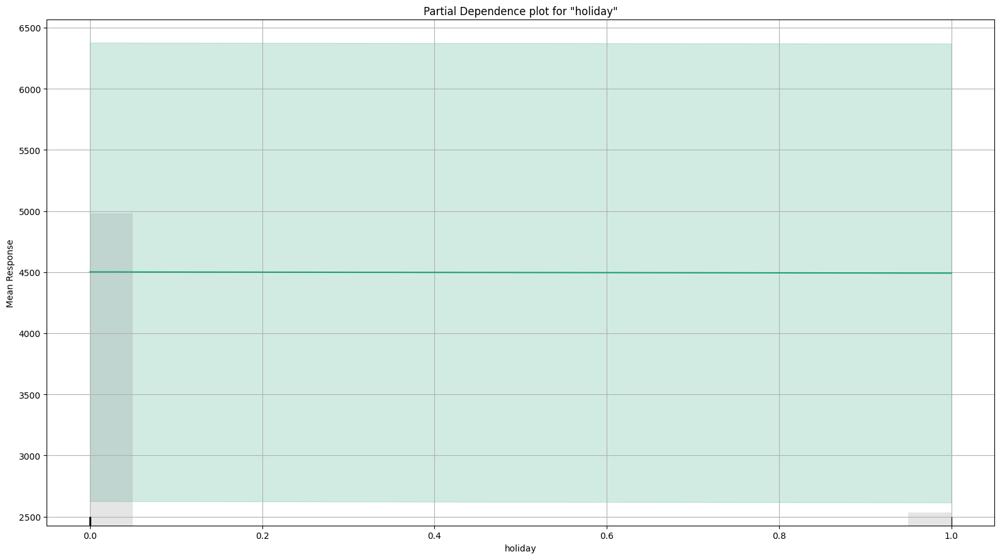

...

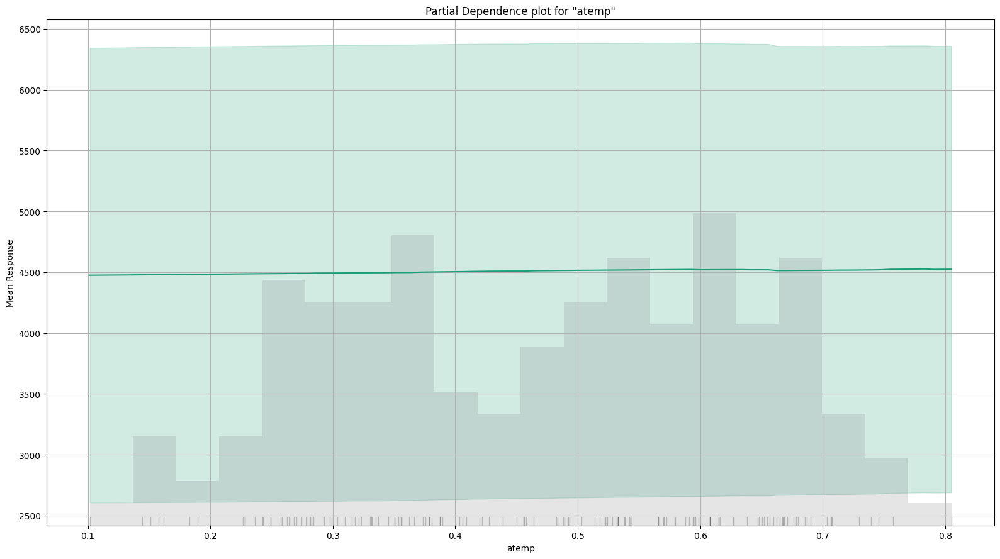

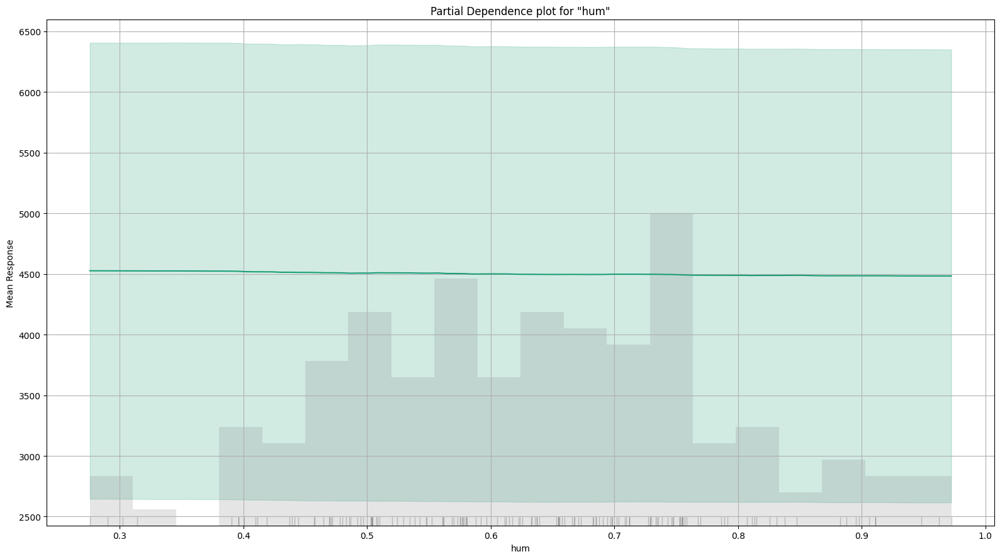

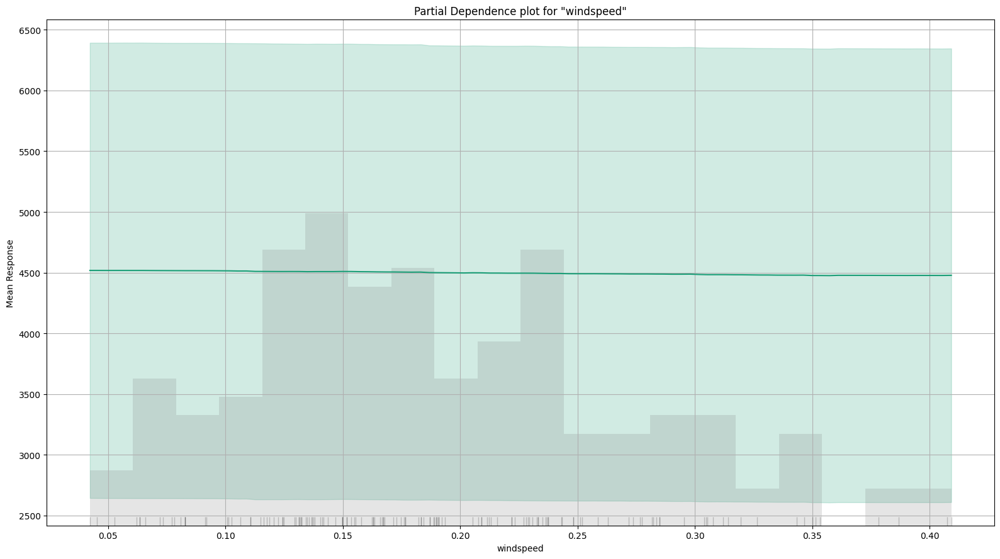

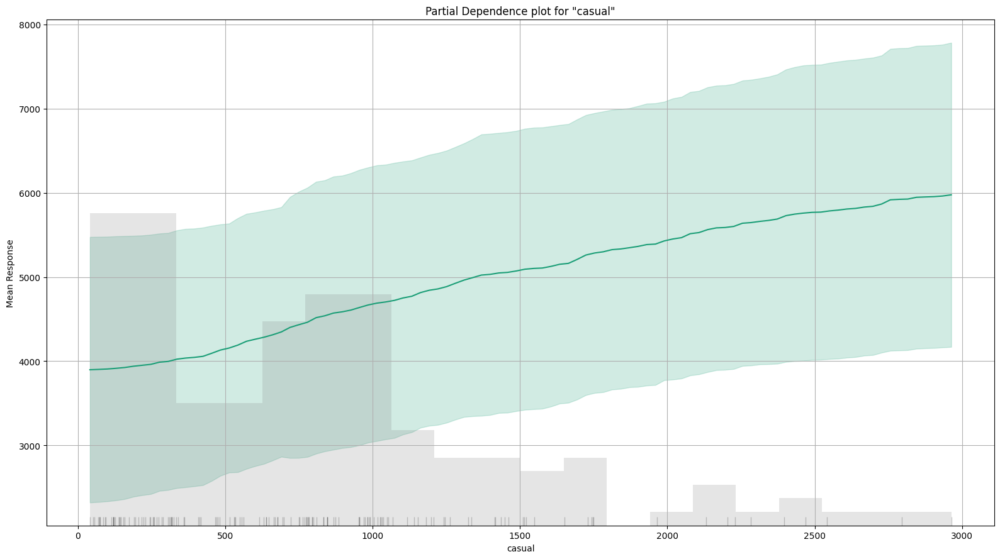

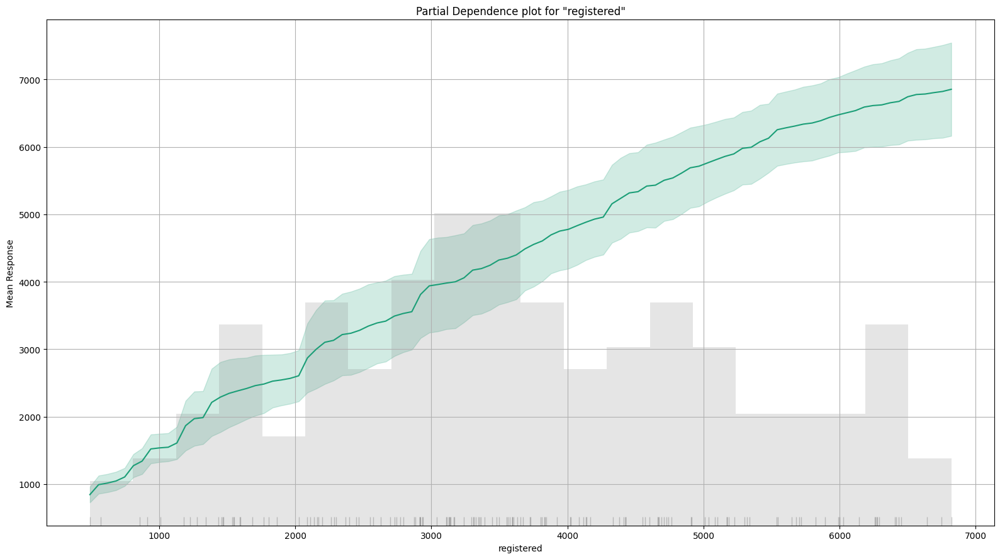

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

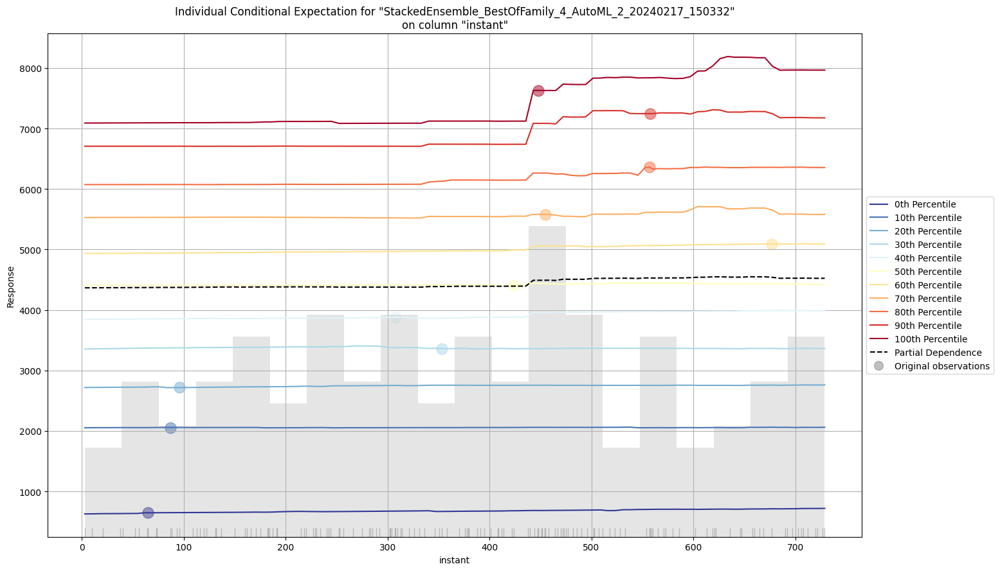

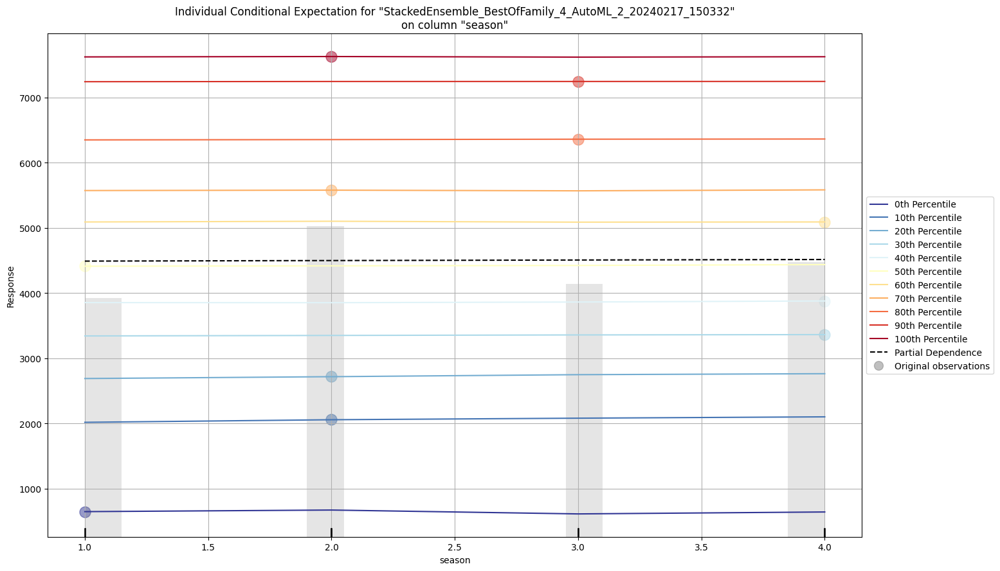

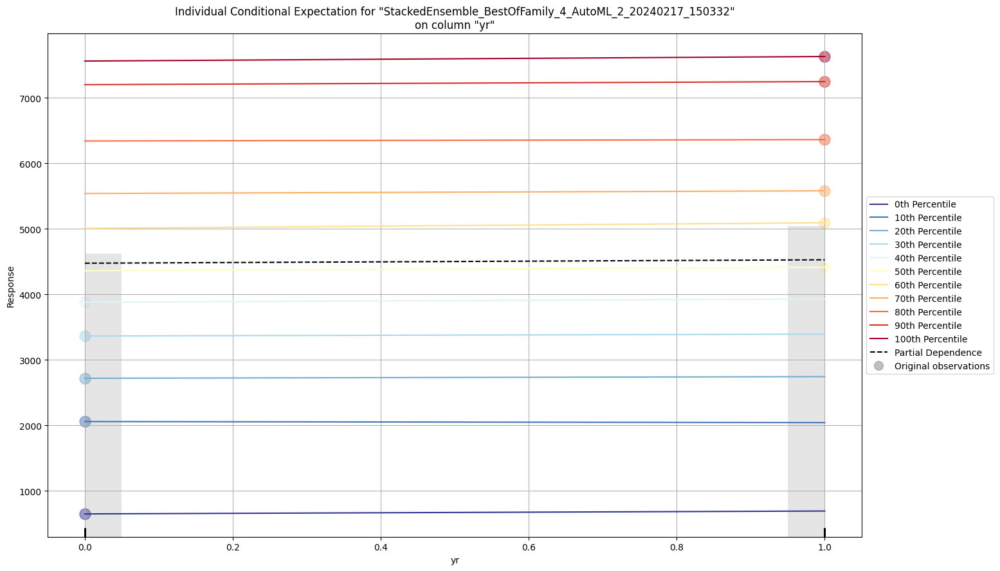

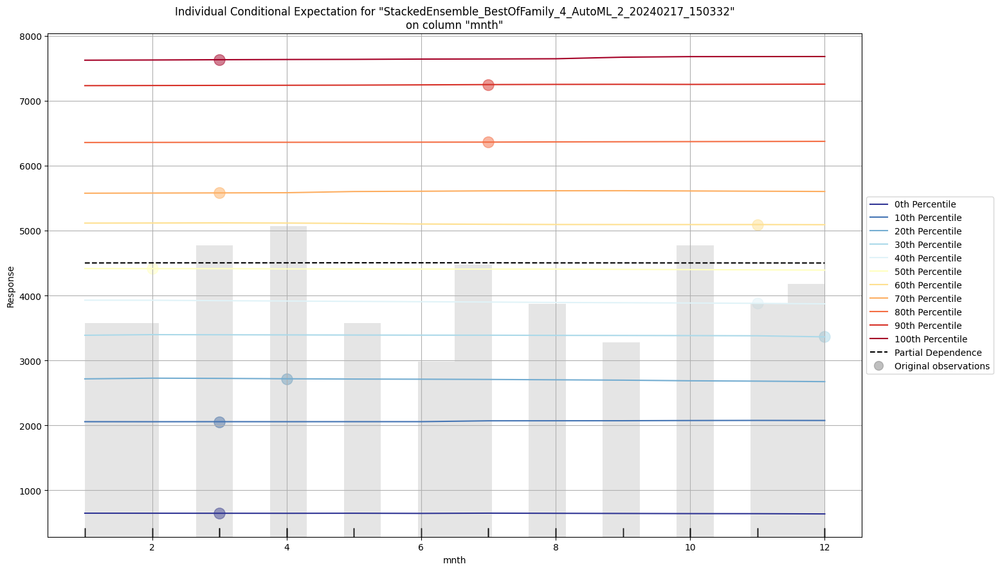

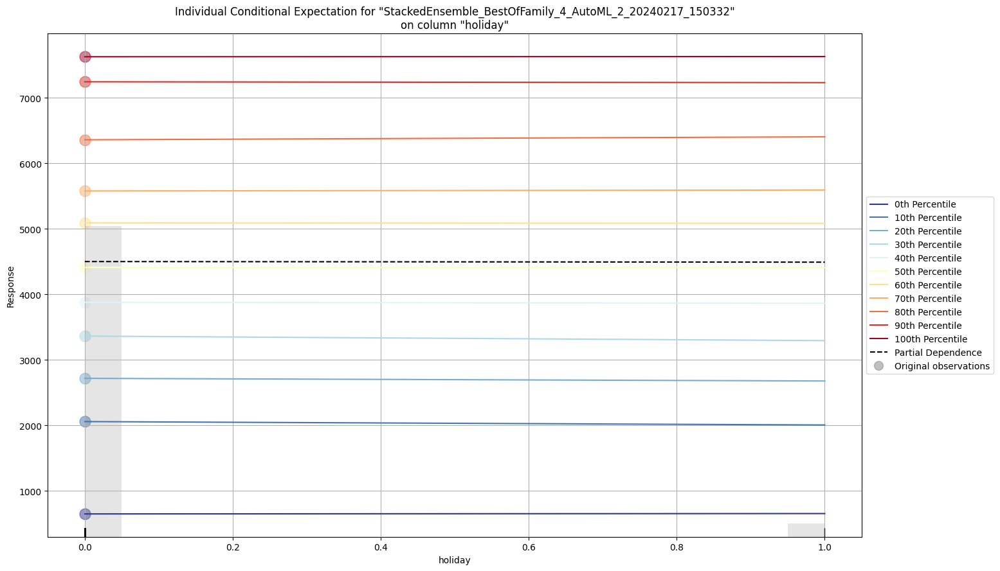

...

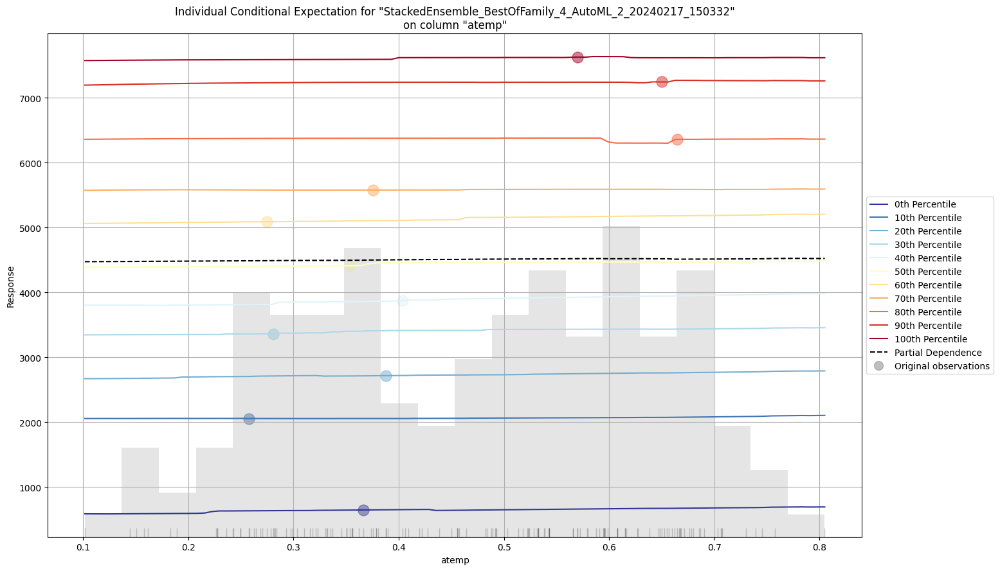

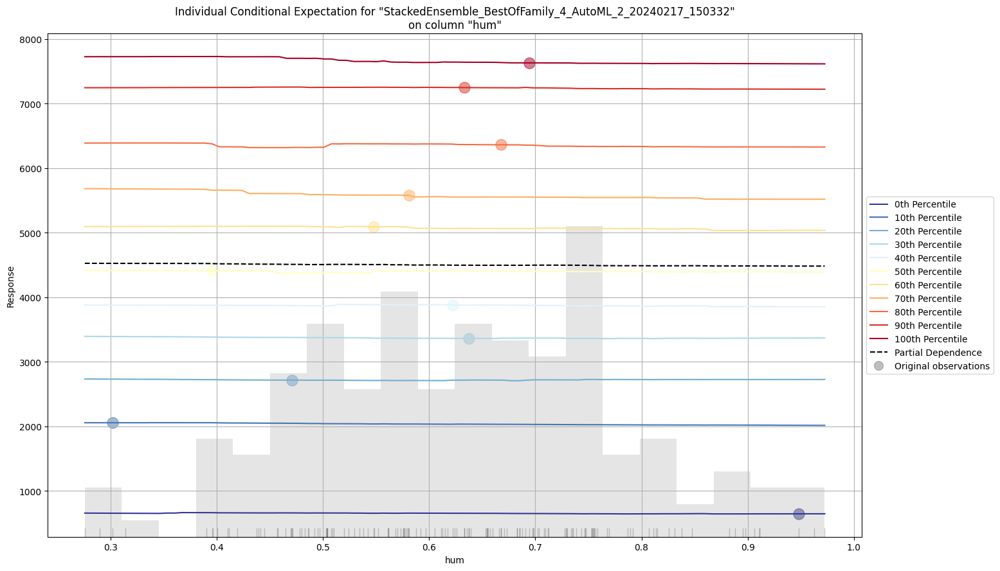

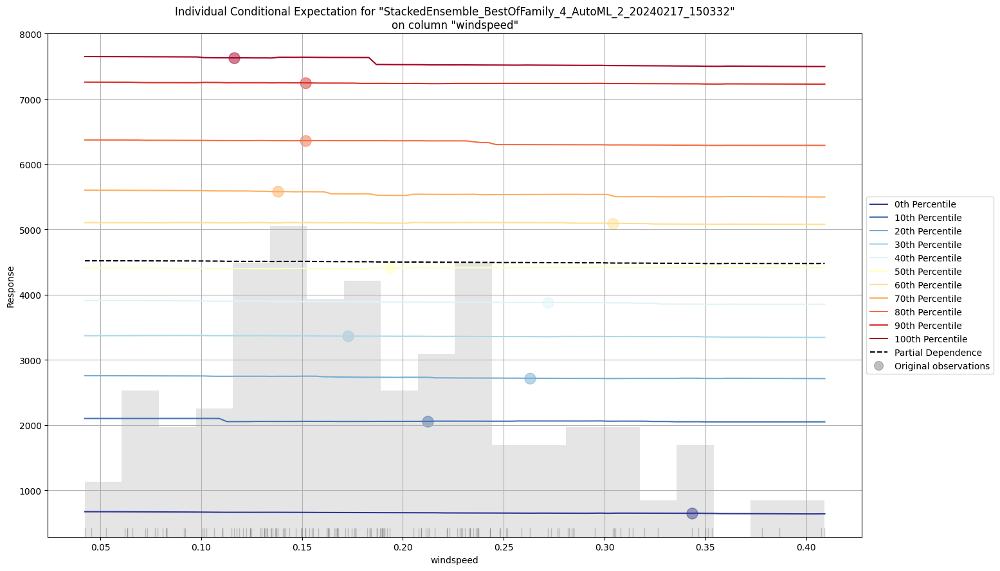

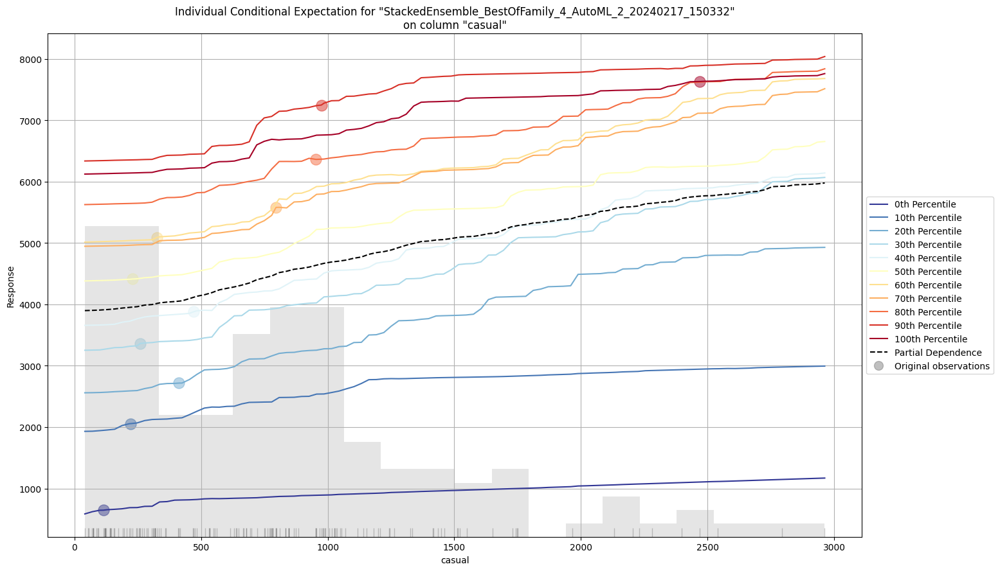

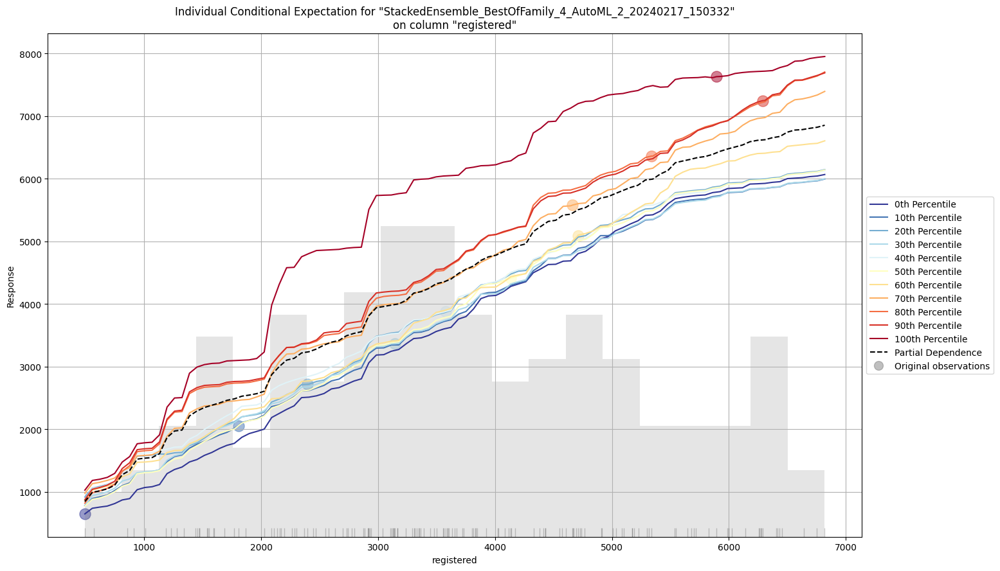

In [20]:
# Explain a single H2O model (e.g. leader model from AutoML)
exm1 = aml1.leader.explain(test_hour)

In [21]:
pred2 = aml1.predict(test_day)

pred2

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


predict
1356.52
1368.32
1490.08
1710.02
1598.88
1023.14
1447.29
2023.49
646.918
1998.5
